## Python notebook template block B

As of now, you created a new notebook for every study day with the related contents. However, when working on a project in the real life, all your data and code needs to be in one place for the project. Going forward in the block, all of the code that you generate with regard to the final project about NAC and the ILO's should be in this one template. Go back to the code you wrote for the previous weeks, evaluate if it is according to [PEP8](https://peps.python.org/pep-0008/) style guide and adjust where necessary. This template provides you with a natural flow through the steps of a traditional data science project. Do not forget to clearly add comments to your code. If you would like to add more stucture, add extra mark down blocks to explain what you are doing. You are **not** allowed to remove code blocks! All blocks in here need to be filled with code. If you did not write code for a section, leave the code block as is with the pre-filled in comment. Adjust this template to your needs, make sure that all your evidence for all of the ILO's is included.

⚠️Important! Before handing it in, run all of your code. All your cells need to show outputs. This is necessary for grading!⚠️

The ILO's for which you can evidence your code by this notebook are: 

| ILO | Poor | Insufficient | Sufficient | Good | Excellent |
|-----|------|--------------|------------|------|-----------|
| 4.1 | x    | x            | x          | x    | x         |
| 4.2 | x    | x            | x          | x    | x*        |
| 5.0 | x    | x            | x          | x    | x         |
| 7.0 | x    | x            | x          | x    | x         |

4.2 excellent*: If you would like to showcast your graphs using streamlit, you need to hand in a seperate .py file. Evidence accordingly in your learning log.




### Add imports here
When working in .py files, you usually have all your package imports at the top of your code. This makes it easy to get a good overview of the packages that you are using and importing. As of now, we are working in .ipynb, but it is good practice to already start implementing these structures. Add all the imports that you use in all of your code in the code block below. In this way, you do not need to add it in every cell.

In [1]:
from pathlib import Path

import numpy as np
# Add your package imports here
import pandas as pd
from sklearn import linear_model
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from feature_engine.selection import DropDuplicateFeatures, DropCorrelatedFeatures, DropConstantFeatures
from sklearn.preprocessing import StandardScaler
from missforest.missforest import MissForest
from sklearn.preprocessing import OneHotEncoder

import functions
from sklearn.base import TransformerMixin, BaseEstimator
from sklearn.model_selection import train_test_split

from sklearn.pipeline import FeatureUnion
from sklearn.metrics import mean_squared_error
import warnings
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier

warnings.filterwarnings('ignore')
from sklearn.tree import DecisionTreeRegressor

from sklearn.ensemble import RandomForestRegressor

from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostRegressor
from sklearn.svm import SVR

from sklearn.svm import SVC
from sklearn.cluster import KMeans

# Importing necessary libraries for data preprocessing
from sklearn.preprocessing import LabelEncoder

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error



## !!!!!!!!!! My functions are outsourced to folder "functions" in the root directory of the project

### Load the data

After your package imports, you usually load your data. This is what you will be working with and what your code will be based on.

In [2]:
nac_df = pd.read_csv("data/NAC_data.csv", parse_dates=['Contract expires'])

nac_df.head(10)

,Player,Team,Team within selected timeframe,Position,Age,Market value,Contract expires,Matches played,Minutes played,Goals,...,Prevented goals per 90,Back passes received as GK per 90,Exits per 90,Aerial duels per 90.1,Free kicks per 90,Direct free kicks per 90,"Direct free kicks on target, %",Corners per 90,Penalties taken,"Penalty conversion, %"
0,S. Baidoo,Salzburg,Liefering,"RCB, LCB",19.0,1000000,2027-06-30,21,1986,1,...,NaN,1.45,NaN,NaN,0.00,0.00,0.0,0.00,0,0.0
1,M. Seidl,Rapid Wien,Blau-Weiß Linz,"LWF, RWF, AMF",22.0,1000000,2024-06-30,26,2293,12,...,NaN,0.24,NaN,NaN,0.39,0.31,0.0,0.12,0,0.0
2,B. Okoh,Salzburg,Liefering,"LCB, RCB",20.0,1000000,2025-06-30,8,476,0,...,NaN,1.32,NaN,NaN,0.00,0.00,0.0,0.00,0,0.0
3,B. Koumetio,Austria Wien,Austria Wien II,LCB,20.0,600000,2025-06-30,4,389,0,...,NaN,3.70,NaN,NaN,0.00,0.00,0.0,0.00,0,0.0
4,M. Polster,Austria Wien,Austria Wien II,"LB, LAMF",20.0,600000,2025-06-30,5,464,1,...,NaN,0.39,NaN,NaN,0.00,0.00,0.0,0.00,0,0.0
5,D. Oroz,Vitesse,Sturm Graz II,RCB,22.0,600000,2024-06-30,7,502,0,...,NaN,3.05,NaN,NaN,0.00,0.00,0.0,0.00,0,0.0
6,O. Strunz,Rapid Wien,Rapid Wien II,"RAMF, RWF, RW",23.0,500000,2027-06-30,4,340,2,...,NaN,0.26,NaN,NaN,0.00,0.00,0.0,0.00,0,0.0
7,C. Lang,Hartberg,Sturm Graz II,"CF, AMF",21.0,500000,2025-06-30,12,1077,5,...,NaN,0.00,NaN,NaN,1.25,0.42,0.0,0.42,1,0.0
8,N. Geyrhofer,Sturm Graz,Sturm Graz II,RCB,23.0,500000,2024-06-30,8,701,0,...,NaN,3.21,NaN,NaN,0.00,0.00,0.0,0.00,0,0.0
9,I. Dramé,Bandırmaspor,Austria Wien II,"LAMF, CF, RWF",21.0,500000,NaT,20,1419,7,...,NaN,0.06,NaN,NaN,0.00,0.00,0.0,0.06,2,100.0


## Data Management and Understanding

### Data Cleansing
In the following section plug in all of your relevant python codes and explanations related to data cleansing. This is related to the poor and insufficient criteria of ILO 4.1 and 4.2.

#### !!!!!!!!!! My functions are outsourced to folder "functions" in the root directory of the project

        Age    Market value      Height     Weight
0      19.0  1000000.000000  186.000000  76.000000
1      22.0  1000000.000000  175.000000  68.000000
2      20.0  1000000.000000  188.000000  91.000000
3      20.0   600000.000000  195.000000  81.000000
4      20.0   600000.000000  183.000000  69.000000
...     ...             ...         ...        ...
16530  20.0   714990.880599  175.000000  65.000000
16531  30.0   532775.527354  185.000000  80.000000
16532  19.0   761817.019975  180.000000  77.000000
16533  19.0   755055.182971  182.820771  74.068134
16534  19.0   755055.182971  182.820771  74.068134

[16535 rows x 4 columns]


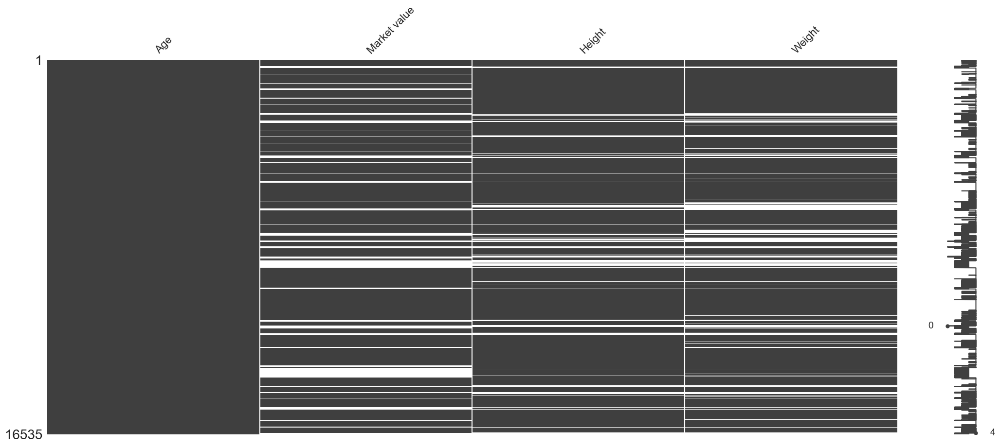

In [3]:
# Initial data preprocessing (comments in the root file of the function)
functions.preprocessing.preprocess(nac_df)




## Second approach in processing data


In [4]:
# Get unique player positions
print(functions.second_approach_preprocess.get_unique_player_positions(nac_df))

Unique Positions:
['RCMF', 'RWB', 'RW', 'LCMF', 'LW', 'AMF', 'CF', 'CB', 'RWF', 'LWF', 'DMF', 'LAMF', 'RCB', 'LB', 'LWB', 'LCB', 'LDMF', 'RB', 'GK', 'RAMF', 'RDMF']


In [5]:
 # Put each player into appropriate position group
nac_df['Main_position'] = nac_df['Position'].astype(str).apply(
    lambda x: functions.second_approach_preprocess.categorize_position(x,
                                                                       lambda: functions.second_approach_preprocess.define_position_groups()))

nac_df['Main_position'].value_counts()

Main_position
Defender      6093
Midfielder    4804
Forward       4302
Goalkeeper    1280
Unknown         56
Name: count, dtype: int64

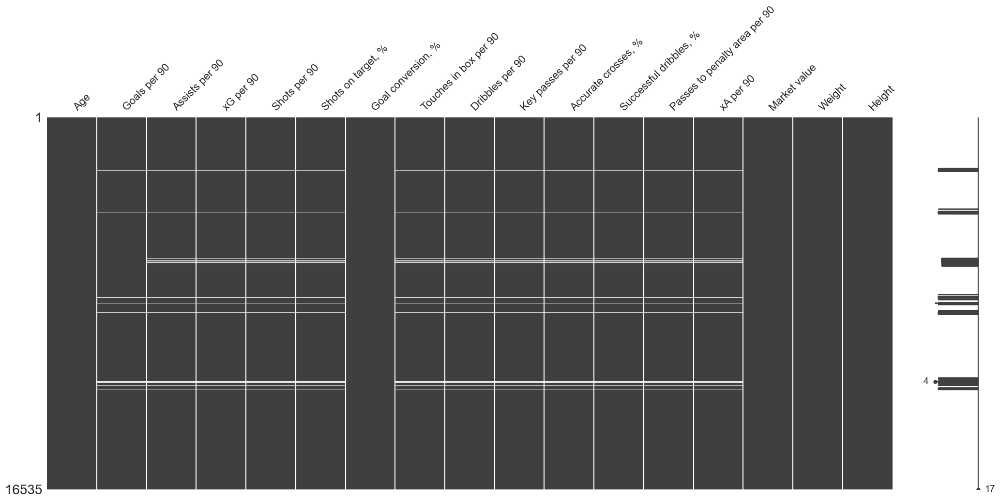

In [6]:
 # Print selected columns (for forwards players)  with missing values

functions.second_approach_preprocess.print_selected_columns_with_missing_values(nac_df)

In [7]:
 # Check the null values in the Main_position column and handle them based on percentage of null values

nac_df = functions.second_approach_preprocess.check_nulls_in_position_column(nac_df);


       Age                    Team Main_position
6264  19.0  Eintracht Braunschweig       Unknown
6281  19.0     Borussia M'gladbach       Unknown
6282  20.0              Hertha BSC       Unknown
6290  20.0              Hertha BSC       Unknown
6295  19.0              Hertha BSC       Unknown
Percentage of null values in  column:  0.34 %
Amount of NANs 56


In [8]:
 # Check the null values in the Age column and handle them based on percentage of null values

nac_df = functions.second_approach_preprocess.check_nulls_in_age_column(nac_df);

Percentage of null values in  column:  0.04 %
Amount of NANs 7


Percentage of null values in  column:  12.06 %
Amount of NANs 1986
Percentage of null values in  column:  16.46 %
Amount of NANs 2712


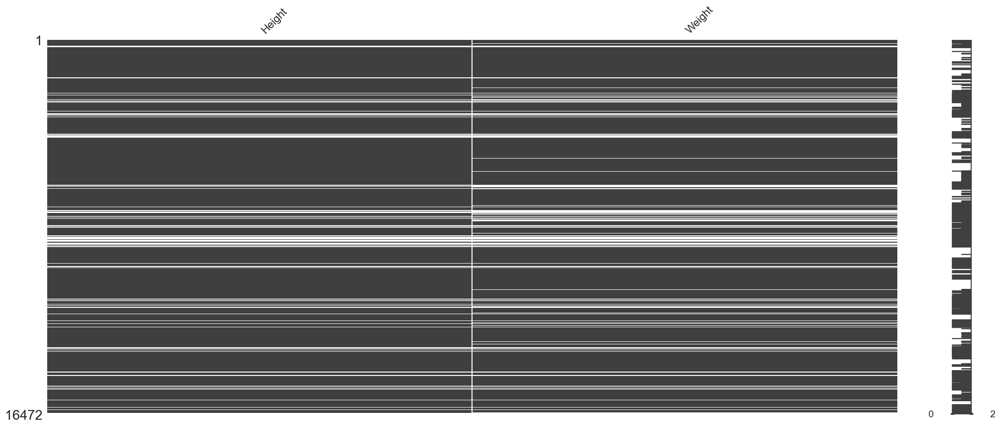

In [9]:
  # Check the null values in the Height  and Weight column and handle them based on percentage of null values

nac_df = functions.second_approach_preprocess.check_nulls_in_height_and_weight_columns(nac_df);

Percentage of null values in  column:  16.29 %
Amount of NANs 2683


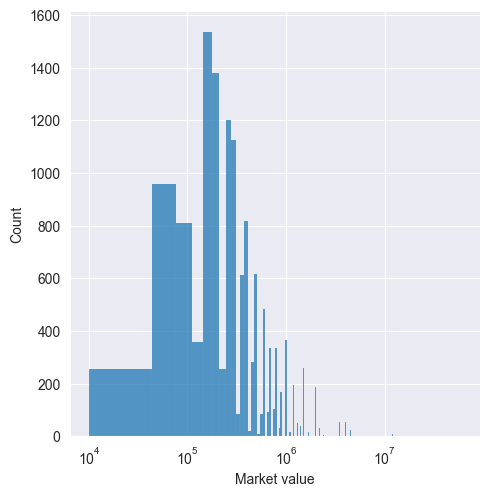

In [10]:

# Check the null values in the Market value column and handle them based on percentage of null values

nac_df = functions.second_approach_preprocess.check_nulls_in_market_value_column(nac_df)

In [11]:
 # Impute data with mice imputer and save it as csv file

# Let's impute Weight, Height and Market value columns
impute_columns = ['Weight', 'Height', 'Market value']

mice_imputed_data = functions.second_approach_preprocess.impute_weight_height_market_value(nac_df[impute_columns])
# Save the imputed file as csv if it does not exist
if not Path(f'{functions.constants.ROOT_PATH_DATA}/sec_appr_mice_imputed_data.csv').exists():
    mice_imputed_data.to_csv(f'{functions.constants.ROOT_PATH_DATA}/sec_appr_mice_imputed_data.csv', index=False)

original_df_copy = nac_df.copy()

nac_df[impute_columns] = mice_imputed_data

Amount of NANs 0


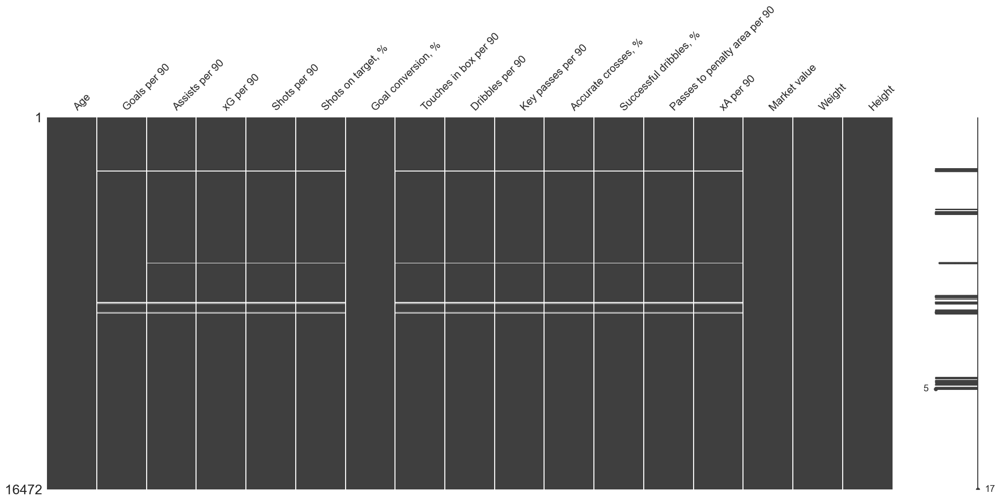

In [12]:
 # Check current status of selected missing values columns

functions.second_approach_preprocess.print_selected_columns_with_missing_values(nac_df)

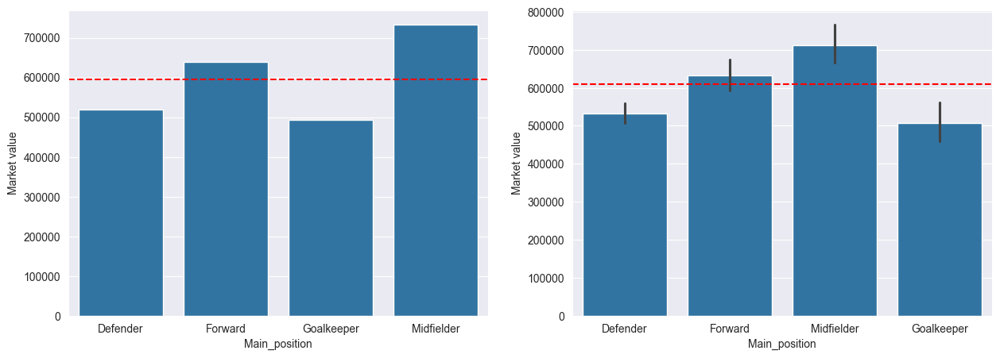

In [13]:
  # Check market value distribution before and after imputing missing values

functions.second_approach_preprocess.check_market_val_dist_beef_and_aft_imputing(original_df_copy, nac_df)



In [14]:
  # Check the number of players in each position


nac_df.to_csv('NAC_data_with_roles.csv')

functions.second_approach_preprocess.print_number_of_player_in_each_pos(nac_df)


Main_position
Defender      6090
Midfielder    4803
Forward       4300
Goalkeeper    1279
Name: count, dtype: int64

## End of the approach

In [15]:
# How many numerical variables are present?

functions.preprocessing.provide_numerical_cols_qty(nac_df)


The dataset has 105 numerical columns


In [16]:
# How many categorical variables are present?
functions.preprocessing.provide_categorical_cols_qty(nac_df)

The dataset has 9 categorical columns


In [17]:
# Are there any missing values present in any of the columns of data? If so, how will you handle the missing values? (Tip: Use the tutorial in here to understand the basics of missing values)

columns_with_missing_values = nac_df.isna().any()

print('There are missing values in these columns')

display(columns_with_missing_values)



#If so, how will you handle the missing values?  
# I would replace missing values using Linear Regression Model ,predefined-values or Pandas built-in functions to replace values either using value from previous or next row

There are missing values in these columns


Player                            False
Team                               True
Team within selected timeframe    False
Position                          False
Age                               False
                                  ...  
Direct free kicks on target, %     True
Corners per 90                     True
Penalties taken                   False
Penalty conversion, %             False
Main_position                     False
Length: 115, dtype: bool

In [18]:
# Are there any duplicate rows present in the dataset? If so, how did you handle it?

functions.preprocessing.check_are_rows_duplicate(nac_df)

There are duplicate values!!!!


(16175, 115)

In [19]:
# Is each column in the dataset stored in the appropriate numeric format?
### Every numerical column is stored properly in float64 or int 64 but
### we can cast every numerical column to float 64 dataframe type to be sure that dataset is stored properly

functions.preprocessing.check_columns_numerical_dtype_validity(nac_df)


Both dataframes are equal: False
Because the original dataframe has some columns of  int64 type, whereas pd.to_numeric converts every column 
datatype to float64. Therefore, new_numeric_df has only float 64 types. 
Since no errors were raised while converting values to numeric ones, the numeric columns are properly formatted


The range of market value 10000.0 - 60000000.0


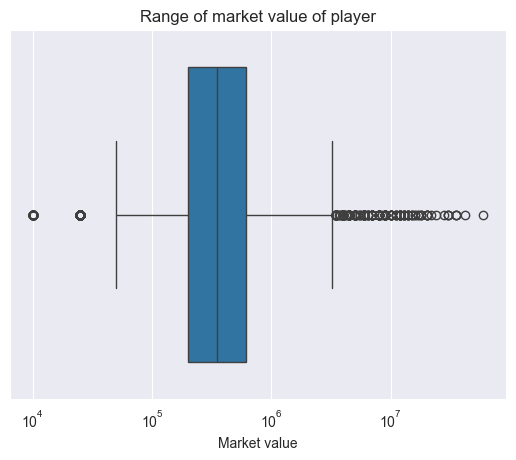

In [20]:
# What is the range of Market Value of the players?
functions.preprocessing.visualize_market_range(nac_df)

In [21]:
# Identify the country of the youngest player in the dataset
functions.preprocessing.find_youngest_players_country(nac_df)

The youngest player is from Estonia


In [22]:
# Performing data cleaning to eliminate all NAN values


In [23]:
# Imputing basic metrics

functions.data_cleansing.preprocess_basic_metrics(nac_df)

basic_metrics_result = functions.data_cleansing.preprocess_basic_metrics(nac_df)

if basic_metrics_result:
    nac_df_with_filled_columns, changed_column_names = basic_metrics_result
    nac_df[changed_column_names] = nac_df_with_filled_columns


In [24]:
other_columns_result = functions.data_cleansing.preprocess_other_columns(nac_df)

if other_columns_result:
    nac_df_with_filled_other_columns, other_changed_column_names = other_columns_result

    nac_df[other_changed_column_names] = nac_df_with_filled_other_columns

    nac_df = functions.data_cleansing.delete_nan_values_from_categorical_columns(nac_df)

    nac_df = functions.data_cleansing.add_contract_left_column(nac_df)

    if not Path('data/NAC_data_without_nans.csv').exists():
        nac_df.to_csv('data/NAC_data_without_nans.csv', index=False)


### Exploratory Data Analysis

Include all exploratory Data Analysis questions you studied in this section. This is related to the sufficient and good criteria of ILO 4.1 and 4.2. 

#### !!!!!!!!!! My functions are outsourced to folder "functions" in the root directory of the project

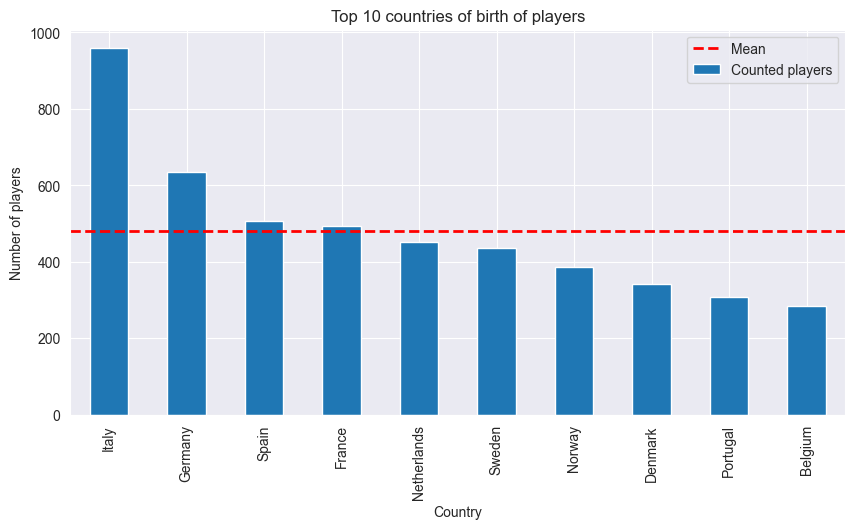

In [25]:

# Present country distribution
functions.Week3DataPrep3.plot_country_distribution(nac_df)

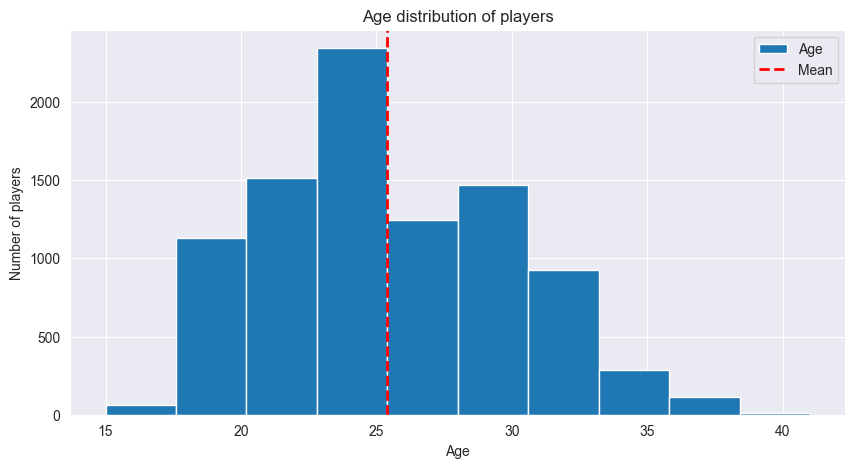

In [26]:
# Present age distribution
functions.Week3DataPrep3.plot_age_distribution(nac_df)


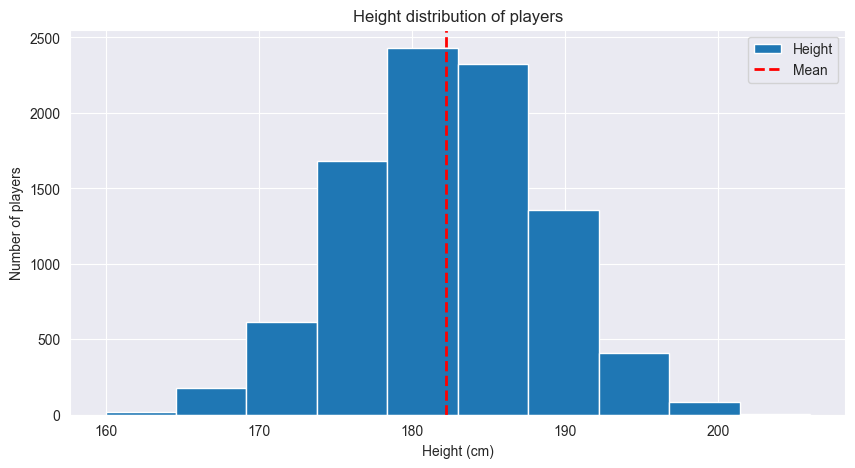

In [27]:
# Present height distribution
functions.Week3DataPrep3.plot_height_distribution(nac_df)

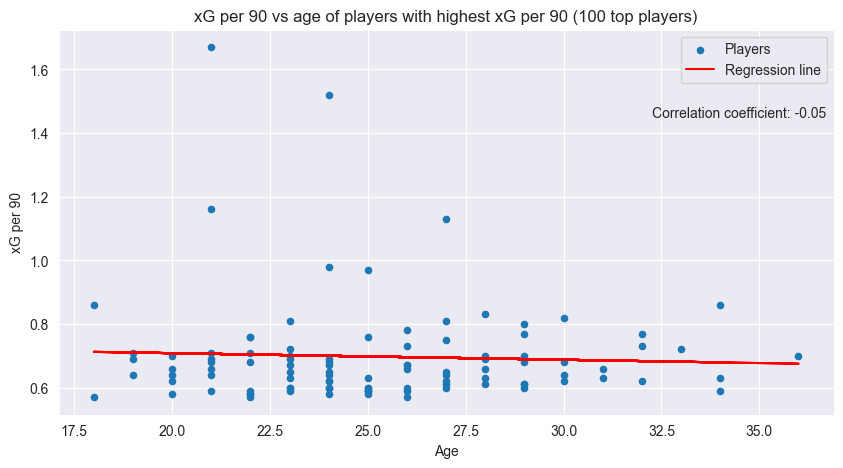

In [28]:
# Present Xg per 90 and age relation

functions.Week3DataPrep3.plot_xg_per_90_vs_age(nac_df)

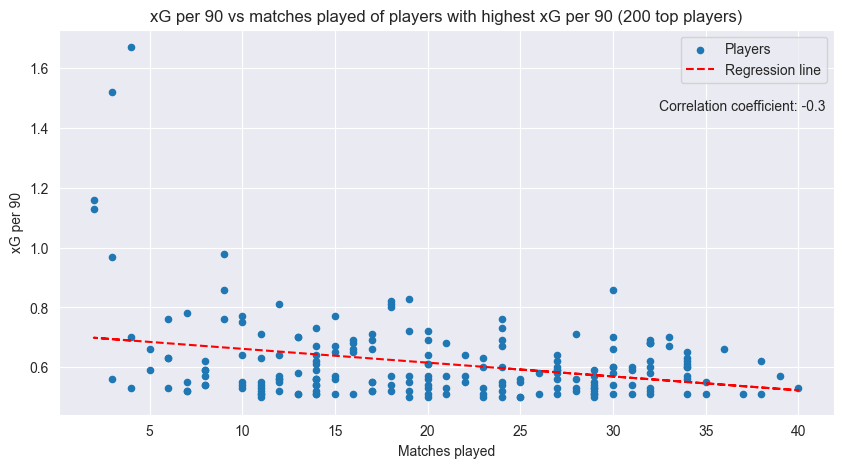

In [29]:
# Present xg per 90 and matches played relation

functions.Week3DataPrep3.plot_xg_per_90_vs_matches_played(nac_df)

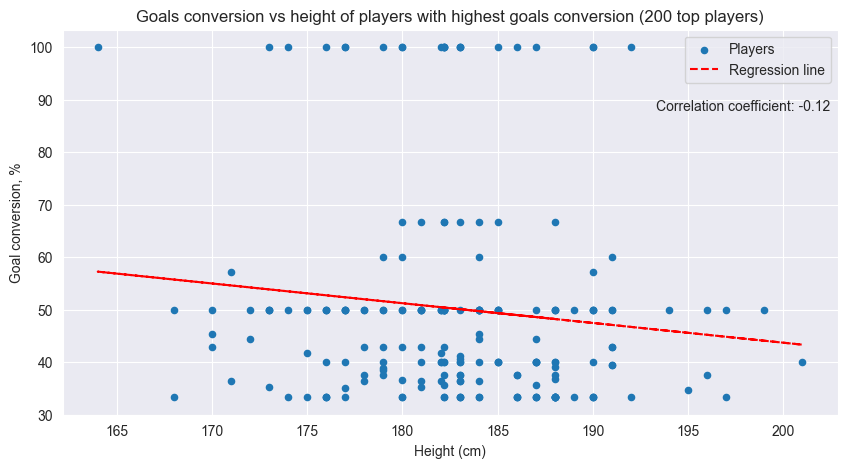

In [30]:
# Present goals conversion and height relation
functions.Week3DataPrep3.plot_goals_conversion_vs_height(nac_df)

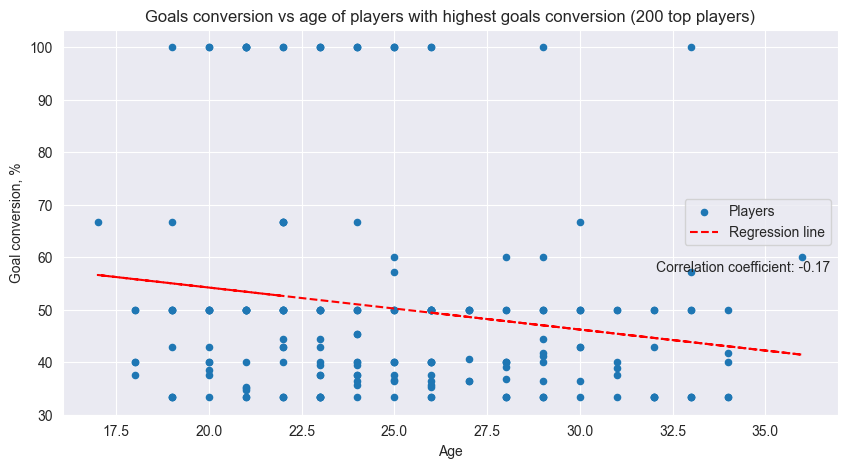

In [31]:
# Present goals conversion and age relation
functions.Week3DataPrep3.plot_goals_conversion_vs_age(nac_df)


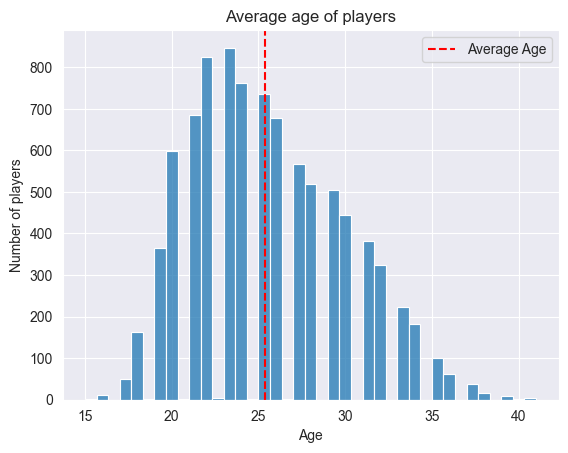

25.39283595209318

In [32]:
# 1. What is the average age of players in the dataset?

functions.Week3DatalabII.player_avg_age(nac_df)

In [33]:
# 2. Which team has the highest market value on average?
functions.Week3DatalabII.team_with_highest_market_value(nac_df)


'Club Brugge'

-0.0639948040120418

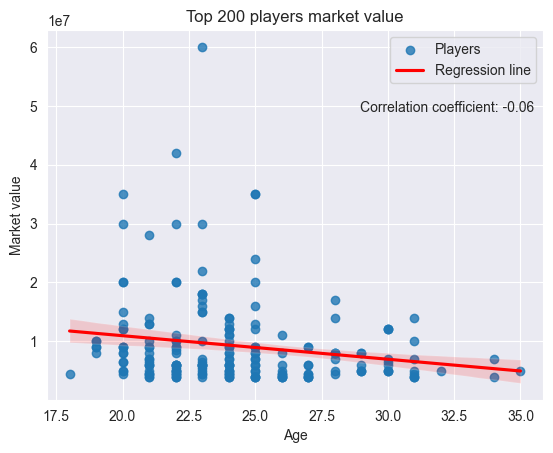

In [34]:
# 3. How does the market value of players correlate with their age?
functions.Week3DatalabII.correlation_market_value_with_age(nac_df)


,Different_positions
Team,
Aris,40
Slavia Praha,32
AZ,29
Club Brugge,28
Utrecht,27
Palermo,27
Greuther Fürth,25
Cagliari,25
Rapid Wien,25


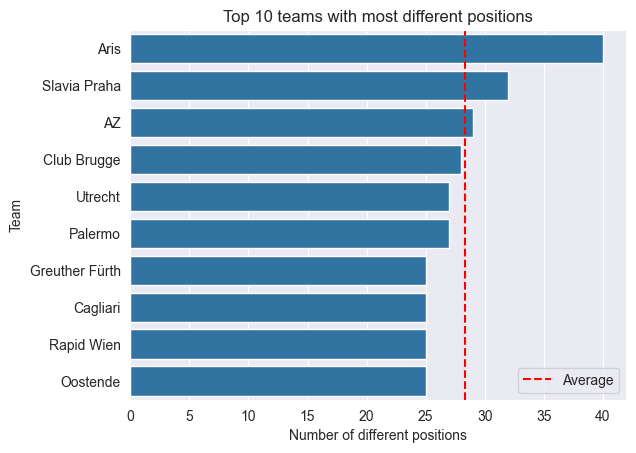

In [35]:
# 4. What is the distribution of players' positions across different teams?
functions.Week3DatalabII.player_positions_distribution_across_teams(nac_df)


'Italy'

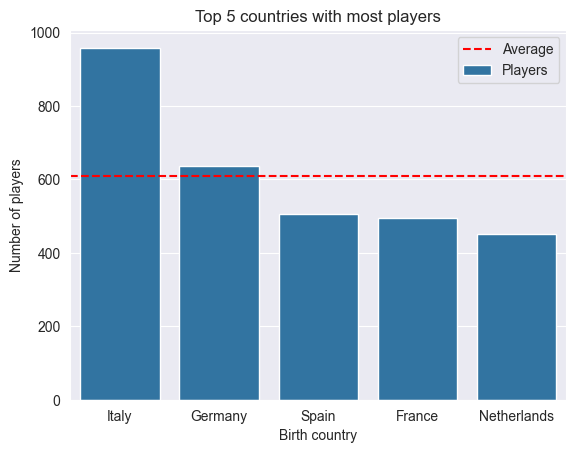

In [36]:
# 5. Which country has the highest representation in the dataset in terms of player birthplace?
functions.Week3DatalabII.country_with_most_common_birthplace(nac_df)


,Height,Weight,Goals
Height,1.000000,0.803727,-0.038826
Weight,0.803727,1.000000,-0.004085
Goals,-0.038826,-0.004085,1.000000


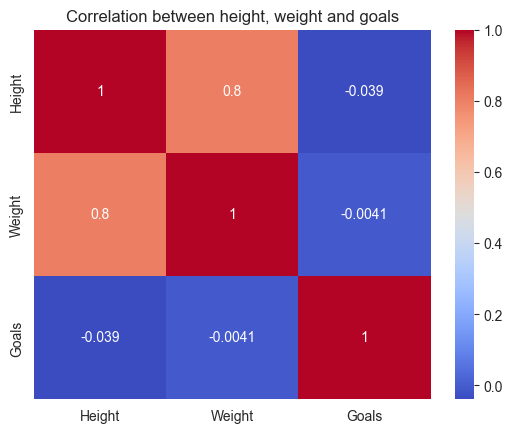

In [37]:
# 6. Is there a correlation between a player's height and weight and the number of goals scored?
functions.Week3DatalabII.correlation_with_height_weight_and_goals(nac_df)


In [38]:
# 7. How does the number of goals per player vary across different positions?
functions.Week3DatalabII.goals_per_player_across_positions(nac_df)


,Position,Goals_avg
0,AMF,3.000000
1,"AMF, CF",2.586957
2,"AMF, CF, LAMF",2.400000
3,"AMF, CF, LCMF",1.416667
4,"AMF, CF, LDMF",3.333333
...,...,...
1158,"RWF, RW, LWF",2.666667
1159,"RWF, RW, RAMF",2.250000
1160,"RWF, RW, RCMF",0.800000
1161,"RWF, RWB",4.000000


,Matches_played_avg
Age,
15.0,13.500000
16.0,14.916667
17.0,17.224490
18.0,17.845679
18.2,16.000000
18.6,18.000000
18.8,11.000000
19.0,17.643836
19.2,13.000000


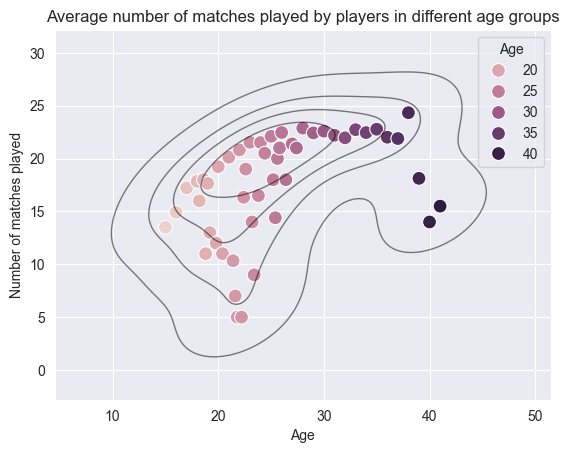

In [39]:
# 8. What is the average number of matches played by players in different age groups?
functions.Week3DatalabII.played_matches_across_different_age_groups(nac_df)


(               Player              Team     xG  Goals
 13988  Duarte Valente  CF Os Belenenses  23.23   22.0
 13094   M. Lebedyński    Chrobry Głogów  23.10   27.0
 1703        M. Livaja      Hajduk Split  21.79   19.0
 639        H. Cuypers              Gent  21.61   27.0
 7206     B. Pauljević            Újpest  20.88   22.0
 ...               ...               ...    ...    ...
 389           R. Žulj             LASK    9.83   11.0
 2766        L. Krejčí      Sparta Praha   9.81   13.0
 12239   A. Hagelskjær             Molde   9.81   13.0
 9702       A. Mercati         Carrarese   9.79   11.0
 10133        M. Rocca            Novara   9.77   11.0
 
 [200 rows x 4 columns],
 0.7028839480629588)

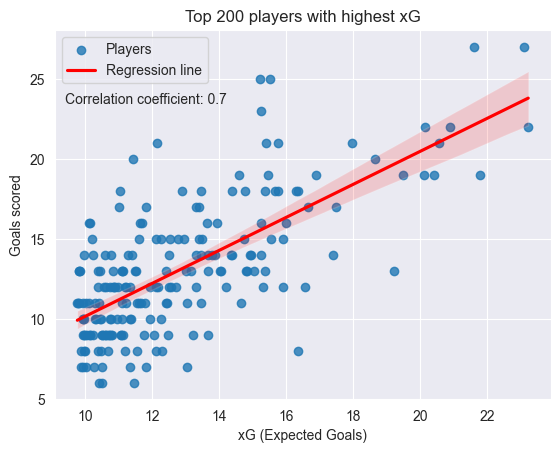

In [40]:
# 9. Which players have the highest ‘xG (Expected Goals)' value and how does it compare with actual goals scored?
functions.Week3DatalabII.compare_highest_xg_with_goals_score(nac_df)


In [41]:
# 10. What is the average contract duration left for players in each team?
functions.Week3DatalabII.avg_duration_left_players_in_each_team(nac_df)


Timedelta('953 days 18:09:01.473203056')

In [42]:
# 11. How do ‘Duels won %' and ‘Aerial duels won %' vary by position?
functions.Week3DatalabII.difference_between_duels_won_and_aerial_duels_won(nac_df)


,Duels_won,Aerial_duels_won,Difference
Position,,,
AMF,48.554444,41.958519,6.595926
"AMF, CF",47.202174,43.058696,4.143478
"AMF, CF, LAMF",51.747000,50.039000,1.708000
"AMF, CF, LCMF",47.789167,39.591667,8.197500
"AMF, CF, LDMF",50.240000,49.276667,0.963333
...,...,...,...
"RWF, RW, LWF",47.923333,40.933333,6.990000
"RWF, RW, RAMF",52.140000,47.426250,4.713750
"RWF, RW, RCMF",47.576000,36.422000,11.154000


,On loan,Successful_defensive_actions_per_90
0,no,7.246159
1,yes,7.122808


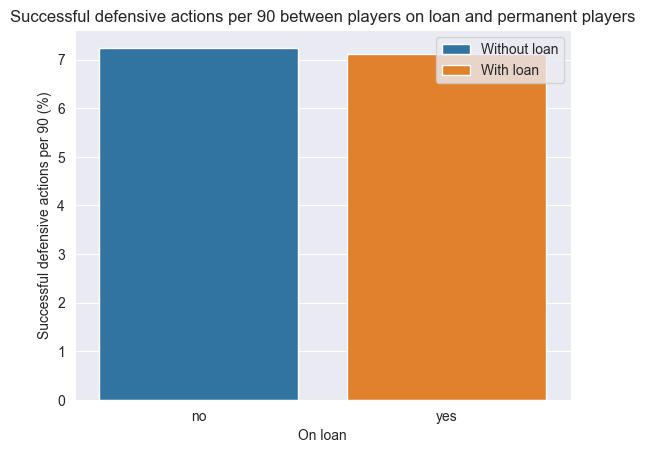

In [43]:
# 12. Is there a significant difference in ‘Successful defensive actions per 90' between players on loan and permanent players?
functions.Week3DatalabII.difference_between_loan_and_permanent_players_in_succ_def_actions_per_90(nac_df)


In [44]:
# 13. Which players have the highest ‘Successful attacking actions per 90' and which position do they play?
functions.Week3DatalabII.highest_succ_att_actions_per_90_by_position(nac_df)


,Player,Position,Successful attacking actions per 90
3669,C. Madueke,"RAMF, RWF",15.95
8622,N. Drori,"LB, LWB",12.00
11549,B. Önal,"LAMF, RAMF",11.90
8178,A. Quinn,"RCB, RB",11.25
16244,R. Book,"CF, AMF, RWF",11.07
...,...,...,...
3690,J. Bakayoko,"RAMF, RWF, RW",6.90
10669,G. Fella,"CF, AMF",6.89
6078,L. Marseiler,"LWF, CF, AMF",6.86
11109,S. Kersten,"LCB, RCB, CB",6.82


In [45]:
# 14. What is the relationship between ‘Goals per 90' and ‘Assists per 90' for forwards?
functions.Week3DatalabII.relation_between_goals_per_90_and_assists_per_90(nac_df)


(                  Player              Team Team within selected timeframe  \
 1               M. Seidl        Rapid Wien                 Blau-Weiß Linz   
 6              O. Strunz        Rapid Wien                  Rapid Wien II   
 7                C. Lang          Hartberg                  Sturm Graz II   
 10           S. Kapsamer         Amstetten                      Amstetten   
 22            M. Pfeifer          Hartberg                        Lafnitz   
 ...                  ...               ...                            ...   
 16471          P. Åslund       Västerås SK                    Västerås SK   
 16474         F. Dzelili  Jönköpings Södra               Jönköpings Södra   
 16475           M. Mitku        Eskilstuna                     Eskilstuna   
 16489  S. Karlsson Grach     Östersunds FK                  Östersunds FK   
 16491       M. Musolytyn     Östersunds FK                  Östersunds FK   
 
             Position   Age  Market value Contract expires  Ma

In [46]:
# 15. Which players exceed in ‘Shots on target %' and how does it relate to their overall ‘Goal conversion %'?
functions.Week3DatalabII.top_players_in_shots_on_target_and_comparison_with_goal_conversion(nac_df)


              Player                    Team   Age        Birth country  \
820         J. Bager               Charleroi  26.0              Denmark   
2122     J. Palacios                   Pafos  29.0             Colombia   
3352       D. Haarbo               København  20.0              Denmark   
3443         N. Dyhr             Midtjylland  22.0              Denmark   
3860    N. Viergever                 Utrecht  33.0          Netherlands   
4014       S. Seymor               Excelsior  21.0          Netherlands   
4485   J. Lehtiranta                     KTP  20.0              Finland   
4671       J. Dossou                 Sochaux  31.0                Benin   
4937        I. Dramé                  Bastia  24.0               France   
5755      S. Decarli  Eintracht Braunschweig  31.0          Switzerland   
5825       V. Müller            MSV Duisburg  23.0              Germany   
6677       M. García                    Aris  26.0            Argentina   
6814         A. Dabo    O

[              Player                    Team   Age        Birth country  \
 820         J. Bager               Charleroi  26.0              Denmark   
 2122     J. Palacios                   Pafos  29.0             Colombia   
 3352       D. Haarbo               København  20.0              Denmark   
 3443         N. Dyhr             Midtjylland  22.0              Denmark   
 3860    N. Viergever                 Utrecht  33.0          Netherlands   
 4014       S. Seymor               Excelsior  21.0          Netherlands   
 4485   J. Lehtiranta                     KTP  20.0              Finland   
 4671       J. Dossou                 Sochaux  31.0                Benin   
 4937        I. Dramé                  Bastia  24.0               France   
 5755      S. Decarli  Eintracht Braunschweig  31.0          Switzerland   
 5825       V. Müller            MSV Duisburg  23.0              Germany   
 6677       M. García                    Aris  26.0            Argentina   
 6814       

[               Player              Team Team within selected timeframe  \
 4          M. Polster      Austria Wien                Austria Wien II   
 6           O. Strunz        Rapid Wien                  Rapid Wien II   
 11          M. Oswald        Rapid Wien                  Rapid Wien II   
 19            T. Koch    Blau-Weiß Linz                 Blau-Weiß Linz   
 20     N. Sattlberger        Rapid Wien                  Rapid Wien II   
 ...               ...               ...                            ...   
 16445     J. Lindberg              GAIS                           GAIS   
 16448     J. Carström     GIF Sundsvall                  GIF Sundsvall   
 16460     A. Thorsson  Jönköpings Södra               Jönköpings Södra   
 16477       M. Widell        Landskrona                     Landskrona   
 16491    M. Musolytyn     Östersunds FK                  Östersunds FK   
 
             Position   Age   Market value Contract expires  Matches played  \
 4           LB, LA

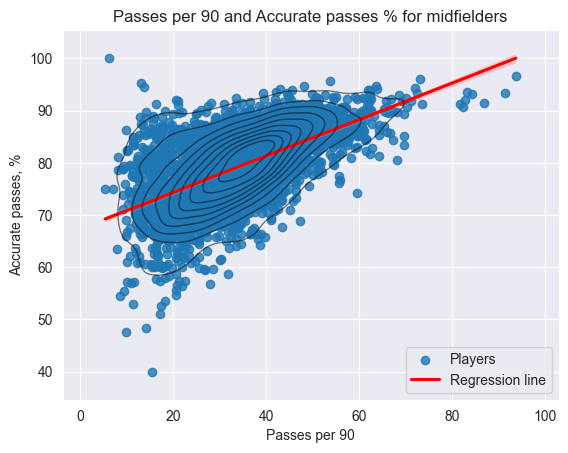

In [47]:
# 16. How do ‘Passes per 90' and ‘Accurate passes %' correlate for midfielders?
functions.Week3DatalabII.passes_per_90_and_accurate_passes(nac_df)


,Save_rate_avg
Age,
17.0,45.280000
18.0,22.201875
18.2,0.000000
19.0,16.001429
20.0,18.018372
20.4,0.000000
21.0,30.495814
22.0,21.946714
22.6,0.000000


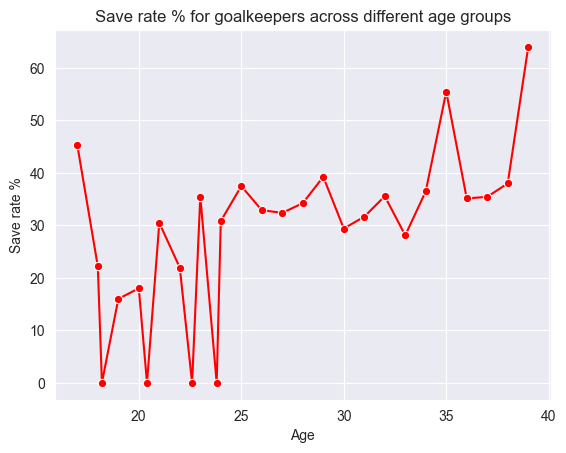

In [48]:
# 17. Is there a trend in the ‘Save rate %' for goalkeepers across different age groups?
functions.Week3DatalabII.trend_in_save_rate_for_goalkeepers_across_diff_age_gr(nac_df)


In [49]:
# 18. What is the distribution of ‘Yellow cards per 90' and ‘Red cards per 90' across different positions?
functions.Week3DatalabII.yellow_red_cards_distribution_across_diff_positions(nac_df)


,yellow_cards_per_90_sum
Position,
AMF,5.01
"AMF, CF",9.31
"AMF, CF, LAMF",1.68
"AMF, CF, LCMF",2.88
"AMF, CF, LDMF",0.73
...,...
"RWF, RW, LWF",0.26
"RWF, RW, RAMF",1.30
"RWF, RW, RCMF",0.59


,Position_area,Fouls_suffered_per_90
0,Attacker,4984.050
1,Defender,3160.314


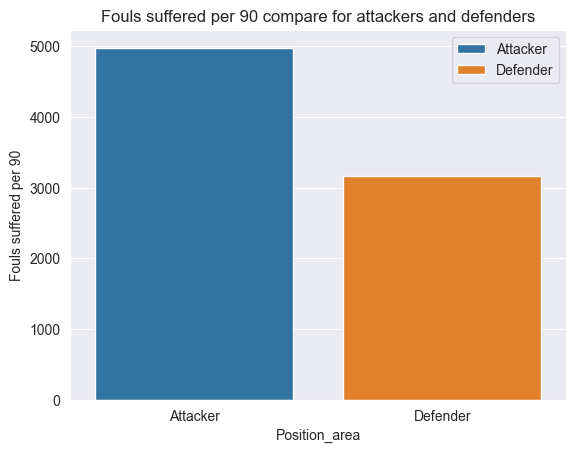

In [50]:
# 19. How does ‘Fouls suffered per 90' compare for attackers and defenders?
functions.Week3DatalabII.fouls_suffered_per_90_compare_for_attackers_and_defenders(nac_df)


In [51]:
# 20. Which players have the highest ‘Penalty conversion %' and what are their overall shooting statistics?
functions.Week3DatalabII.players_with_highest_penalty_conversion(nac_df)


,Player,Team,Shots against,Shots against per 90,Shots blocked per 90,Shots,Shots per 90,"Shots on target, %",Shot assists per 90,"Penalty conversion, %"
36,J. Keiblinger,St. Pölten,0.0,4.906,0.10,25.0,0.82,36.00,1.77,100.0
53,P. Fallmann,Freiburg II,0.0,5.140,0.19,9.0,0.44,44.44,1.60,100.0
67,M. Şatin,Bregenz,0.0,4.436,0.08,30.0,2.47,36.67,1.98,100.0
121,A. Neumayer,St. Pölten,0.0,4.120,0.07,15.0,0.53,40.00,0.67,100.0
129,E. Tepecik,Rapid Wien II,0.0,4.494,0.00,23.0,2.61,21.74,1.36,100.0
...,...,...,...,...,...,...,...,...,...,...
2042,Miguel Ángel Guerrero,Anorthosis,0.0,4.234,0.00,35.0,1.98,54.29,1.07,100.0
2047,Sergio Tejera,Anorthosis,0.0,4.348,0.23,11.0,0.83,27.27,1.36,100.0
2150,F. Durmishaj,Nea Salamis,0.0,4.036,0.00,10.0,1.59,50.00,0.48,100.0
2173,E. Henty,AEL,0.0,4.150,0.00,26.0,1.92,42.31,1.03,100.0


### Visualizations

Include all the visualizations you made in this section. This is related to the excellent criteria of ILO 4.2. Use the blocks below to enter the code for graphs you created with matplotlib (or seaborn, bokeh, or another visualization package). 

❗ If you would like to showcast your visualizations using streamlit, you need to hand in a seperate .py file for this. It is not possible to run streamlit code from a python notebook. Please note down below if you do so.

# ❗❗❗❗❗❗❗❗ I am including my streamlit app in separate directory called streamlit_app in this project
##### The project consists of 3 main file, homepage.py ,  2_customized_charts.py, 3_detailed_charts.py  
##### Main file is homepage.py which is responsible for navigation between other files
##### There are 2 other files which are responsible for showing charts
##### 2_customized_charts.py is responsible for showing charts which are customized by user
##### 3_detailed_charts.py is responsible for showing charts which are not customized by user and show detailed information on various topics
##### Every file in directory streamlit_app belongs to the project and is a part of it
#### To run project type streamlit run homepage.py in terminal

### Database and ETL

Include all the python code and explanations on your RESTful API and database operations in this section. This is related to the excellent criteria of ILO 4.1.

❗ These code you cannot showcast using the NAC data. Use the data provided for the homework and datalab preperation of these modules.

#### !!!!!!!!!! My functions are outsourced to folder "functions" in the root directory of the project

In [52]:
# Include your code here  for the API and ETL. This is not done on the NAC data.





In [53]:
# Connecting to my SQL database
connection = functions.Week3DataPrep2_DB.connect_to_mysql('online_movies_rating')


In [54]:
# Showing databases
functions.Week3DataPrep2_DB.show_databases(connection)


('information_schema',)
('mysql',)
('online_movie_rating',)
('online_movies_rating',)
('performance_schema',)
('sakila',)
('sys',)
('world',)


In [55]:
# Creating the movie database
functions.Week3DataPrep2_DB.create_movie_database(connection)


1007 (HY000): Can't create database 'online_movies_rating'; database exists


In [56]:
# Creating the movies table
functions.Week3DataPrep2_DB.create_movies_table(connection)


1050 (42S01): Table 'movies' already exists


In [57]:
# Creating the reviewers table
functions.Week3DataPrep2_DB.create_reviewers_table(connection)


1050 (42S01): Table 'reviewers' already exists


In [58]:
# Creating the ratings table
functions.Week3DataPrep2_DB.create_ratings_table(connection)


1050 (42S01): Table 'ratings' already exists


In [59]:
# Altering the movies table
functions.Week3DataPrep2_DB.alter_movies_table(connection)


('id', 'int', 'NO', 'PRI', None, 'auto_increment')
('title', 'varchar(100)', 'YES', '', None, '')
('release_year', 'year', 'YES', '', None, '')
('genre', 'varchar(100)', 'YES', '', None, '')
('collection_in_mil', 'decimal(4,1)', 'YES', '', None, '')


In [60]:
# Function to insert movies query

functions.Week3DataPrep2_DB.insert_movies_queries(connection)

In [61]:
# Inserting reviewers and ratings
functions.Week3DataPrep2_DB.insert_reviewers_and_ratings(connection)


1062 (23000): Duplicate entry '17-5' for key 'ratings.PRIMARY'


In [62]:
# Selecting movies
functions.Week3DataPrep2_DB.select_movies(connection)


(2, 'The New Movie', 2023, 'Action', Decimal('15.5'))
(3, 'Assimilated 24hour instruction set', 1985, 'knowledge', Decimal('48.0'))
(4, 'Digitized multi-tasking alliance', 2016, 'hear', Decimal('90.0'))
(5, 'Synergized background time-frame', 2000, 'idea', Decimal('66.0'))
(6, 'Vision-oriented high-level info-mediaries', 2004, 'rest', Decimal('9.0'))


In [63]:
# Performing movie operations
functions.Week3DataPrep2_DB.perform_movie_operations(connection)


(2, 'The New Movie', 2023, 'Action', Decimal('15.5'))
(3, 'Assimilated 24hour instruction set', 1985, 'knowledge', Decimal('48.0'))
(4, 'Digitized multi-tasking alliance', 2016, 'hear', Decimal('90.0'))
(5, 'Synergized background time-frame', 2000, 'idea', Decimal('66.0'))
(6, 'Vision-oriented high-level info-mediaries', 2004, 'rest', Decimal('9.0'))
(7, 'Synergistic multi-tasking instruction set', 1993, 'cover', Decimal('22.0'))
(8, 'Quality-focused didactic definition', 2014, 'win', Decimal('100.0'))
(9, 'Synergistic content-based hardware', 2021, 'knowledge', Decimal('36.0'))
(10, 'Business-focused optimal workforce', 2003, 'mind', Decimal('34.0'))
(11, 'Polarized clear-thinking orchestration', 2012, 'accept', Decimal('73.0'))
(12, 'Horizontal client-driven forecast', 1992, 'citizen', Decimal('51.0'))
(13, 'Fully-configurable web-enabled collaboration', 1997, 'company', Decimal('69.0'))
(14, 'Reactive regional process improvement', 2000, 'avoid', Decimal('26.0'))
(15, 'Automated 24/

In [64]:
# 1. Display random user data

functions.Week3DataPrep2.display_random_user()



'{"results":[{"gender":"male","name":{"title":"Mr","first":"Arttu","last":"Raisanen"},"location":{"street":{"number":7613,"name":"Myllypuronkatu"},"city":"Teuva","state":"Pirkanmaa","country":"Finland","postcode":47695,"coordinates":{"latitude":"-22.9264","longitude":"-161.0509"},"timezone":{"offset":"+8:00","description":"Beijing, Perth, Singapore, Hong Kong"}},"email":"arttu.raisanen@example.com","login":{"uuid":"1bdc7d96-5d64-449d-bfce-3eaa29a60566","username":"smallwolf286","password":"wolfie","salt":"v2zrtJ29","md5":"8261ab2645a66eda94ff157cb1e82507","sha1":"481b7967a5202b4dc4c473d66e3e14cae402048c","sha256":"f4d6785ebfb99febe5ac2a9fbdee028143768dc8e556e5655064563a95007bd1"},"dob":{"date":"1995-06-06T01:05:02.485Z","age":28},"registered":{"date":"2015-09-13T18:26:47.418Z","age":8},"phone":"03-563-033","cell":"044-796-32-58","id":{"name":"HETU","value":"NaNNA605undefined"},"picture":{"large":"https://randomuser.me/api/portraits/men/64.jpg","medium":"https://randomuser.me/api/portra

In [65]:
# 2. Get information about a specific cat breed
functions.Week3DataPrep2.get_cat_breed_info()


{'weight': {'imperial': '7  -  10', 'metric': '3 - 5'},
 'id': 'abys',
 'name': 'Abyssinian',
 'cfa_url': 'http://cfa.org/Breeds/BreedsAB/Abyssinian.aspx',
 'vetstreet_url': 'http://www.vetstreet.com/cats/abyssinian',
 'vcahospitals_url': 'https://vcahospitals.com/know-your-pet/cat-breeds/abyssinian',
 'temperament': 'Active, Energetic, Independent, Intelligent, Gentle',
 'origin': 'Egypt',
 'country_codes': 'EG',
 'country_code': 'EG',
 'description': 'The Abyssinian is easy to care for, and a joy to have in your home. They’re affectionate cats and love both people and other animals.',
 'life_span': '14 - 15',
 'indoor': 0,
 'lap': 1,
 'alt_names': '',
 'adaptability': 5,
 'affection_level': 5,
 'child_friendly': 3,
 'dog_friendly': 4,
 'energy_level': 5,
 'grooming': 1,
 'health_issues': 2,
 'intelligence': 5,
 'shedding_level': 2,
 'social_needs': 5,
 'stranger_friendly': 5,
 'vocalisation': 1,
 'experimental': 0,
 'hairless': 0,
 'natural': 1,
 'rare': 0,
 'rex': 0,
 'suppressed_ta

In [66]:
# 3. Download a chart image and print content type
# Saved in images folder (chart_api.png)
content_type, image_content = functions.Week3DataPrep2.download_chart_image()
print(content_type)


image/png


In [67]:
# 4. Authenticate with GitHub and print user information
access_token = functions.Week3DataPrep2.authenticate_github()
functions.Week3DataPrep2.print_github_user_info(access_token)


This access token is expired or invalid.
No access token provided.


In [68]:
# 5. Get a GIF from Giphy based on a search term
functions.Week3DataPrep2.get_giphy_gif()


Season 5 Idk GIF by Paramount+ | https://giphy.com/gifs/CBSAllAccess-season-5-episode-23-i-love-lucy-JRhS6WoswF8FxE0g2R


In [69]:
# 6. Search for books on Google Books
functions.Week3DataPrep2.search_google_books()


Moby Dick (2015-06-29)
In een van de onbetwiste hoogtepunten uit de wereldliteratuur voert de bezeten kapitein Achab een mythische strijd met Moby Dick, een witte walvis. Vanwege dat beest is hij ooit zijn been verloren en nu is de kapitein uit op wraak. Achab offert willens en wetens het welzijn van zijn schip en bemanning op aan zijn persoonlijke haat tegen Moby Dick, die voor hem het kwaad, de erfzonde en het demonische vertegenwoordigt. Hij is vastbesloten het beest te vinden en hij laat zich door niets of niemand tegenhouden om dat doel te behalen. De Amerikaanse Herman Melville (1819-1891) schreef in 1851 MOBY DICK, naar een ongewoon grote en agressieve witte potvis die zoveel rampen zou hebben veroorzaakt voor de walvisvaarders dat het was uitgegroeid tot een mythe. De roman werd in die tijd niet goed ontvangen. Het verkreeg pas na zijn dood bekendheid en is inmiddels uitgegroeid tot een van de belangrijkste meesterwerken uit de Amerikaanse literatuur.

Moby Dick (1892)
A litera

## Machine Learning

### Identifying basic Machine Learning applications.
In the following subsection, show your understanding of each of the listed Machine Learning algorithms. Excecute these algorithms on the NAC dataset. This is related to the poor (and insufficient) criteria of ILO 5.0. 

❗Remember! All your package imports should be on top of this notebook.

## !!!!!! I am using untouched original NAC Dataset for model training to better handle feature selection and achieve higher accuracy


## !!!!!! I am implementing the model training code here because of jupyter notebook compatibility issues with outsourced files and models

In [70]:
# data_df = NAC dataset
data_df = pd.read_csv("data/NAC_data.csv", parse_dates=['Contract expires'])

data_df.columns = [col.lower().replace(', %', '').replace(' ', '_') for col in data_df.columns]

data_df.head(10)

,player,team,team_within_selected_timeframe,position,age,market_value,contract_expires,matches_played,minutes_played,goals,...,prevented_goals_per_90,back_passes_received_as_gk_per_90,exits_per_90,aerial_duels_per_90.1,free_kicks_per_90,direct_free_kicks_per_90,direct_free_kicks_on_target,corners_per_90,penalties_taken,penalty_conversion
0,S. Baidoo,Salzburg,Liefering,"RCB, LCB",19.0,1000000,2027-06-30,21,1986,1,...,NaN,1.45,NaN,NaN,0.00,0.00,0.0,0.00,0,0.0
1,M. Seidl,Rapid Wien,Blau-Weiß Linz,"LWF, RWF, AMF",22.0,1000000,2024-06-30,26,2293,12,...,NaN,0.24,NaN,NaN,0.39,0.31,0.0,0.12,0,0.0
2,B. Okoh,Salzburg,Liefering,"LCB, RCB",20.0,1000000,2025-06-30,8,476,0,...,NaN,1.32,NaN,NaN,0.00,0.00,0.0,0.00,0,0.0
3,B. Koumetio,Austria Wien,Austria Wien II,LCB,20.0,600000,2025-06-30,4,389,0,...,NaN,3.70,NaN,NaN,0.00,0.00,0.0,0.00,0,0.0
4,M. Polster,Austria Wien,Austria Wien II,"LB, LAMF",20.0,600000,2025-06-30,5,464,1,...,NaN,0.39,NaN,NaN,0.00,0.00,0.0,0.00,0,0.0
5,D. Oroz,Vitesse,Sturm Graz II,RCB,22.0,600000,2024-06-30,7,502,0,...,NaN,3.05,NaN,NaN,0.00,0.00,0.0,0.00,0,0.0
6,O. Strunz,Rapid Wien,Rapid Wien II,"RAMF, RWF, RW",23.0,500000,2027-06-30,4,340,2,...,NaN,0.26,NaN,NaN,0.00,0.00,0.0,0.00,0,0.0
7,C. Lang,Hartberg,Sturm Graz II,"CF, AMF",21.0,500000,2025-06-30,12,1077,5,...,NaN,0.00,NaN,NaN,1.25,0.42,0.0,0.42,1,0.0
8,N. Geyrhofer,Sturm Graz,Sturm Graz II,RCB,23.0,500000,2024-06-30,8,701,0,...,NaN,3.21,NaN,NaN,0.00,0.00,0.0,0.00,0,0.0
9,I. Dramé,Bandırmaspor,Austria Wien II,"LAMF, CF, RWF",21.0,500000,NaT,20,1419,7,...,NaN,0.06,NaN,NaN,0.00,0.00,0.0,0.06,2,100.0


#### Simple machine learning modelling pipeline

In [71]:



class FeatureSelector(TransformerMixin, BaseEstimator):
    def __init__(self, feature_names):
        self.feature_names = feature_names

    def fit(self, _X, _y=None):
        return self

    def transform(self, _X, _y=None):
        return _X.loc[:, self.feature_names]


In [72]:
class NumericalTransformer(BaseEstimator, TransformerMixin):

    def fit(self, _X, _y=None):
        return self

    def transform(self, _X, _y=None):
        features = _X.columns

        for feature in features:
            if feature == 'weight' or feature == 'height':
                _X.loc[:, feature] = _X.loc[:, feature].replace(to_replace=0, value=np.nan)

        return _X



In [73]:
class NumericalImputer(BaseEstimator, TransformerMixin):

    def fit(self, _X, _y=None):
        return self

    def transform(self, _X, _y=None):
        if _X.isna().sum().sum() <= 0:
            return _X

        mice_imputer = IterativeImputer(estimator=linear_model.BayesianRidge(), n_nearest_features=None,
                                        imputation_order='ascending')

        column_names = _X.columns
        imputed = mice_imputer.fit_transform(_X)

        df = pd.DataFrame(data=imputed, columns=column_names)

        return df



In [74]:
class Printer(BaseEstimator, TransformerMixin):

    def fit(self, _X, _y=None):
        return self

    def transform(self, _X, _y=None):
        print("This is printer !!!! It does nothing, just helps with debugging :)")
        print("Number of missing values : ")
        if isinstance(_X, pd.DataFrame) or isinstance(_X, pd.Series):
            print(_X.isna().sum())

        print("---------------------------------------------------------- " * 2)
        print(_X)

        return _X

In [75]:
class CategoricalTransformer(BaseEstimator, TransformerMixin):
    def fit(self, _X, _y=None):
        return self

    @staticmethod
    def define_position_groups():
        # Define the position groups
        goalkeeper = ['GK']
        defenders = ['CB', 'LCB', 'RCB', 'LB', 'RB', 'LWB', 'RWB']
        midfielders = ['DMF', 'LDMF', 'RDMF', 'CMF', 'LCMF', 'RCMF', 'AMF', 'LAMF', 'RAMF']
        forwards = ['CF', 'LW', 'RW', 'LWF', 'RWF']

        return goalkeeper, defenders, midfielders, forwards

    def connect_position_group_with_type(self, pos):
        goalk, defnd, midf, forw = self.define_position_groups()

        if pos in goalk:
            return "Goalkeeper"
        elif pos in defnd:
            return "Defender"
        elif pos in midf:
            return "Midfielder"
        elif pos in forw:
            return "Forward"
        else:
            raise ValueError

    def transform_position_to_position_types(self, positions):

        position_types = []

        for position in positions:

            if position is not np.nan and isinstance(position, str):
                single_position = max(position.split(', '), key=position.count)
                position_types.append(self.connect_position_group_with_type(single_position))
            else:
                position_types.append(np.nan)

        return position_types

    @staticmethod
    def set_bin_boundaries():

        # Group market_value into bins based on quartiles

        # Low bin = 0 - 0.1 millions 0 
        # Medium bin = 0.1-0.45 millions 1 
        # High bin = 0.45 - 42 millions 2 
        Low_bin = 0.1

        Medium_bin = 0.45

        High_bin = 42

        return Low_bin, Medium_bin, High_bin

    def transform_market_value_to_bins(self, values):
        low, medium, high = self.set_bin_boundaries()

        bins = []
        for value in values:
            value = value / 1000000

            bin_val = 0

            if low < value <= medium:
                bin_val = 1
            elif medium < value <= high:
                bin_val = 2

            bins.append(bin_val)

        return bins

    def transform(self, _X, _y=None):
        columns = _X.columns
        if 'position' in columns:
            _X.loc[:, 'position'] = self.transform_position_to_position_types(_X.loc[:, 'position'])
            _X.loc[:, 'position'] = _X.loc[:, 'position'].astype('object')
        if 'market_value' in columns:
            _X.loc[:, 'market_value'] = self.transform_market_value_to_bins(_X.loc[:, 'market_value'])

        return _X

In [76]:



class CategoricalImputer(BaseEstimator, TransformerMixin):

    def fit(self, _X, _y=None):
        return self

    def transform(self, _X, _y=None):
        if _X.isna().sum().sum() <= 0:
            return _X
        miss_forest = MissForest()

        imputed_data = miss_forest.fit_transform(_X, _X.columns)

        df = pd.DataFrame(data=imputed_data, columns=_X.columns)

        return df

In [77]:
def plot_missing_values(selected_features, missing_vals_perc):
    missing_values_df = pd.DataFrame(
        data={'feature': selected_features, 'missing_values_percentage': missing_vals_perc})

    fig, ax = plt.subplots(figsize=(9, 5))

    sns.barplot(x='feature', y='missing_values_percentage', data=missing_values_df)

    ax.set_xlabel('Feature')

    ax.set_ylabel('Missing values percentage (%)')
    plt.show()

In [78]:
class TransformNumericalFeature(BaseEstimator, TransformerMixin):
    def fit(self, _X, _y=None):
        return self

    def transform(self, _X, _y=None):
        if ('weight' in _X.columns) and ('height' in _X.columns):
            _X['bmi'] = _X['weight'] / ((_X['height'] / 100) ** 2)
            _X = _X.drop(['weight', 'height'], axis=1)

        return _X

In [79]:
# Analyze missingness in the dataset

def show_missing_values_and_percentages(num_features, cat_features, target_variable, df):
    selected_features = [*num_features, *cat_features, target_variable]

    missing_vals_perc = []
    for selected_feature in selected_features:
        all_missing_values_in_column = df[selected_feature].isna().sum()
        missing_values_percentage = round((all_missing_values_in_column / len(data_df[selected_feature])) * 100, 2)
        display(f'Number of missing values in {selected_feature} column : {all_missing_values_in_column} , '
                f'which is {missing_values_percentage} % of all values')

        missing_vals_perc.append(missing_values_percentage)

    plot_missing_values(selected_features, missing_vals_perc)

In [80]:
def num_transformer_pipeline(num_features):
    num_ppl = Pipeline(steps=[
        # Step 1 Select Features
        ('select_features', FeatureSelector(feature_names=num_features)),

        # Step 2 Drop columns
        ('drop_constant_features', DropConstantFeatures(tol=1, missing_values='ignore')),
        ('drop_correlated_features', DropCorrelatedFeatures(threshold=0.98, missing_values='ignore')),
        ('drop_duplicated_features', DropDuplicateFeatures(missing_values='ignore')),

        # Step 3 Cleaning

        ('numerical_transformer', NumericalTransformer()),

        # Step 4 Impute

        ('numerical_imputer', NumericalImputer()),

        # Additional transformation (Added after evaluation of model)
        ('transform_numerical_feature', TransformNumericalFeature()),

        # Step 5 Scaling 

        # ('printer', Printer()),
        ('scaler', StandardScaler())

    ])

    return num_ppl



In [81]:
def cat_transformer_pipeline(cat_features):
    cat_ppl = Pipeline(steps=[
        # Step 1 Select features
        ('select_features', FeatureSelector(feature_names=cat_features)),

        # Step 2 Drop columns

        ('drop_duplicated_features', DropDuplicateFeatures(missing_values='ignore')),

        # Step 3 Cleaning
        ('categorical_transformer', CategoricalTransformer()),

        # Step 4 Imputing

        ('imputer', CategoricalImputer()),

        # ('printer', Printer()),

        # Step 5 Scaling

        ('scaler', OneHotEncoder(sparse_output=False)),

        # ('printer', Printer()),

    ])

    return cat_ppl

In [82]:
def transform_pipeline(num_ppl, cat_ppl):
    transform_ppl = FeatureUnion(transformer_list=[
        ('num_ppl', num_ppl),
        ('cat_ppl', cat_ppl)
    ])
    return transform_ppl




In [83]:
def eliminate_missing_values_in_target_variable(df, target_variable):
    df = df.copy()
    if df[target_variable].isna().sum() > 0:
        print('There are missing values in target variable')
        print('Dropping rows with missing values in target variable')
        missing_values_percentage = round((df[target_variable].isna().sum() / len(df[target_variable]) * 100),
                                          2)
        print('Number of missing values in target variable : ', df[target_variable].isna().sum())
        print('Which is ', missing_values_percentage, '% of all values')

    df = df.dropna(subset=[target_variable], how='any', axis=0)
    return df

In [84]:

def provide_full_pipeline(model_obj, num_features, cat_features, target_variable, df):
    # show_missing_values_and_percentages(num_features, cat_features, target_variable, df)

    df = eliminate_missing_values_in_target_variable(df, target_variable)

    cat_ppl = cat_transformer_pipeline(cat_features)

    num_ppl = num_transformer_pipeline(num_features)

    transform_ppl = transform_pipeline(num_ppl, cat_ppl)

    full_ppl = Pipeline(steps=[
        ('ppl', transform_ppl),
        ('model', model_obj)
    ])

    model_properties = full_ppl.named_steps['model']

    return full_ppl, df, model_properties


In [85]:
class TargetVariableTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, target_variable, is_regression):
        self.target_variable = target_variable
        self.is_regression = is_regression
        self.label_encoder = LabelEncoder()

    def fit(self, _X, _y=None):

        return self

    @staticmethod
    def define_position_groups():
        # Define the position groups
        goalkeeper = ['GK']
        defenders = ['CB', 'LCB', 'RCB', 'LB', 'RB', 'LWB', 'RWB']
        midfielders = ['DMF', 'LDMF', 'RDMF', 'CMF', 'LCMF', 'RCMF', 'AMF', 'LAMF', 'RAMF']
        forwards = ['CF', 'LW', 'RW', 'LWF', 'RWF']

        return goalkeeper, defenders, midfielders, forwards

    def connect_position_group_with_type(self, pos):
        goalk, defnd, midf, forw = self.define_position_groups()

        if pos in goalk or pos in defnd:

            return "Defender side"

        elif pos in midf or pos in forw:
            return "Attackers side"
        else:
            raise ValueError

    def transform_position_to_position_types(self, positions):
        position_types = []

        for position in positions:
            if position is np.nan:
                raise Exception(
                    print('Dropping missing values failed !!! because there are still NANs in the target column'))

            single_position = max(position.split(', '), key=position.count)
            position_types.append(self.connect_position_group_with_type(single_position))

        return position_types

    def transform(self, _X, _y=None):

        if self.target_variable == 'position':
            _X.loc[:, 'position'] = self.transform_position_to_position_types(_X.loc[:, 'position'])

        if not self.is_regression:

            target_variable_series = _X.loc[:, self.target_variable]

            unique_elements = len(target_variable_series.unique())

            if unique_elements <= 2:
                self.label_encoder.fit_transform(_X.loc[:, self.target_variable])
            elif unique_elements > 2:
                raise ValueError('The target variable is not binary, please change the target variable to binary')

        return _X




In [86]:
def target_variable_pipeline(target_variable, is_regression):
    gen_ppl = Pipeline(steps=[
        ('transform_target', TargetVariableTransformer(target_variable=target_variable, is_regression=is_regression))
    ])

    return gen_ppl

In [87]:
def model_training(func):
    def wrapper(df, num_features, cat_features, target_variable, model_obj, is_regression=True, *args):

        model, new_df, model_properties = provide_full_pipeline(model_obj, num_features=num_features,
                                                                cat_features=cat_features,
                                                                target_variable=target_variable, df=df)

        new_df = target_variable_pipeline(target_variable, is_regression).fit_transform(new_df)

        X = new_df.drop(target_variable, axis=1)

        y = new_df[target_variable]

        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        model.fit(X_train, y_train)

        res = func(model, X_test, y_test, model_properties, *args)

        if is_regression:

            r2_score = model.score(X_test, y_test)

            rmse = (mean_squared_error(y_test, model.predict(X_test)) ** (1 / 2))

            mae = mean_absolute_error(y_test, model.predict(X_test))

            print(f'R2 score: {r2_score}')
            print('MSE: ', rmse ** 2)
            print(f'RMSE: {rmse}')
            print(f'MAE: {mae}')
        else:
            score = model.score(X_test, y_test)
            print('Score', score)

            y_pred = model.predict(X_test)
            print(classification_report(y_test, y_pred))

            cm = confusion_matrix(y_test, y_pred)
            sns.heatmap(cm, annot=True, fmt='d')
            plt.show()

        return res

    return wrapper



#### Linear regression

In [88]:
# Enter your code here for linear regression
# Split the data into train and test sets

linreg = LinearRegression()


@model_training
def linear_regression(model, X_test, y_test, model_properties):
    # additional functionalities 

    pass



In [89]:
# Predict xg of a player based on his stats, position and market value was transformed to position_types (Forwards, Midfielders, Goalkeepers, Defenders) and market_value was transformed to 3 bins (Low, Medium, High) respectively

linear_regression(data_df, ['age', 'goals', 'xa', 'assists', 'weight', 'height'], ['position', 'market_value'], 'xg',
                  linreg)





  File "C:\Users\kacsa\AppData\Local\Programs\Python\Python312\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000157 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3
[LightGBM] [Info] Number of data points in the train set: 13182, number of used features: 1
[LightGBM] [Info] Start training from score -1.239912
[LightGBM] [Info] Start training from score -1.319256
[LightGBM] [Info] Start training from score -1.009612
[LightGBM] [Info] Start training from score -2.539632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

#### Logistic regression

In [90]:
# Enter your code here for logistic regression


logreg = LogisticRegression()


@model_training
def logistic_regression(model, X_test, y_test, model_properties):
    # additional functionality 
    pass





There are missing values in target variable
Dropping rows with missing values in target variable
Number of missing values in target variable :  56
Which is  0.34 % of all values
Score 0.7066140776699029
                precision    recall  f1-score   support

Attackers side       0.77      0.70      0.73      1875
 Defender side       0.64      0.72      0.68      1421

      accuracy                           0.71      3296
     macro avg       0.70      0.71      0.70      3296
  weighted avg       0.71      0.71      0.71      3296


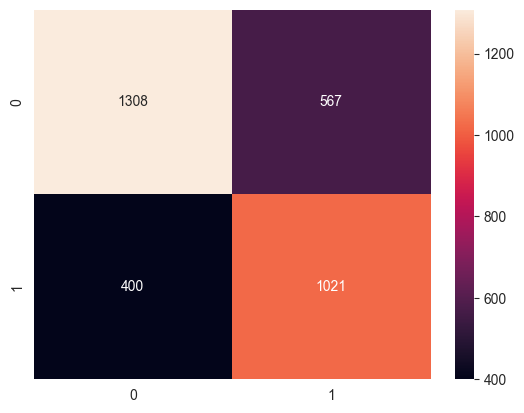

In [91]:
# Predicting if the player on the attackers side or defenders side
# (Forwards , Midfielders) or (Goalkeepers, Defenders)

logistic_regression(data_df, ['age', 'goals', 'xa', 'assists', 'weight', 'height', 'xg'], ['on_loan', 'market_value'],
                    'position',
                    logreg, is_regression=False)


#### Tree-based model

In [92]:
# Enter your code here for tree-based decision model


dtc = DecisionTreeClassifier()


@model_training
def decision_tree_classifier(model, X_test, y_test, model_properties):
    # additional functionality 
    pass



There are missing values in target variable
Dropping rows with missing values in target variable
Number of missing values in target variable :  56
Which is  0.34 % of all values
Score 0.6480582524271845
                precision    recall  f1-score   support

Attackers side       0.70      0.68      0.69      1875
 Defender side       0.59      0.61      0.60      1421

      accuracy                           0.65      3296
     macro avg       0.64      0.64      0.64      3296
  weighted avg       0.65      0.65      0.65      3296


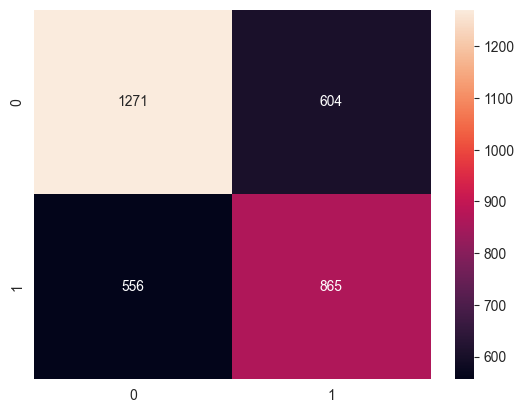

In [93]:
# Predicting if the player on the attackers side or defenders side
# (Forwards , Midfielders) or (Goalkeepers, Defenders)

decision_tree_classifier(data_df, ['age', 'goals', 'xa', 'assists', 'weight', 'height', 'xg'],
                         ['on_loan', 'market_value'],
                         'position',
                         dtc, is_regression=False)

In [94]:


dtr = DecisionTreeRegressor()


@model_training
def decision_tree_regressor(model, X_test, y_test, model_properties):
    # additional functionality 
    pass




In [95]:
# Predict xg of a player based on his stats, position and market value was transformed to position_types (Forwards, Midfielders, Goalkeepers, Defenders) and market_value was transformed to 3 bins (Low, Medium, High) respectively

decision_tree_regressor(data_df, ['age', 'goals', 'xa', 'assists', 'weight', 'height'], ['position', 'market_value'],
                        'xg',
                        dtr)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3
[LightGBM] [Info] Number of data points in the train set: 13182, number of used features: 1
[LightGBM] [Info] Start training from score -1.239912
[LightGBM] [Info] Start training from score -1.319256
[LightGBM] [Info] Start training from score -1.009612
[LightGBM] [Info] Start training from score -2.539632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

In [96]:


rf = RandomForestRegressor()


@model_training
def random_forest_regressor(model, X_test, y_test, model_properties):
    # additional functionality 
    pass


In [97]:
# Predict xg of a player based on his stats, position and market value was transformed to position_types (Forwards, Midfielders, Goalkeepers, Defenders) and market_value was transformed to 3 bins (Low, Medium, High) respectively

random_forest_regressor(data_df, ['age', 'goals', 'xa', 'assists', 'weight', 'height'], ['position', 'market_value'],
                        'xg',
                        rf)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3
[LightGBM] [Info] Number of data points in the train set: 13182, number of used features: 1
[LightGBM] [Info] Start training from score -1.239912
[LightGBM] [Info] Start training from score -1.319256
[LightGBM] [Info] Start training from score -1.009612
[LightGBM] [Info] Start training from score -2.539632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

In [98]:



br = BaggingRegressor()


@model_training
def bagging_regressor(model, X_test, y_test, model_properties):
    # additional functionality 
    pass

In [99]:
# Predict xg of a player based on his stats, position and market value was transformed to position_types (Forwards, Midfielders, Goalkeepers, Defenders) and market_value was transformed to 3 bins (Low, Medium, High) respectively

bagging_regressor(data_df, ['age', 'goals', 'xa', 'assists', 'weight', 'height'], ['position', 'market_value'],
                  'xg',
                  br)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000091 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3
[LightGBM] [Info] Number of data points in the train set: 13182, number of used features: 1
[LightGBM] [Info] Start training from score -1.239912
[LightGBM] [Info] Start training from score -1.319256
[LightGBM] [Info] Start training from score -1.009612
[LightGBM] [Info] Start training from score -2.539632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

#### Gradient Boosting Trees and SVM

In [100]:
# Enter your code here for Gradient Boosting


gradient_boost_r = GradientBoostingRegressor()


@model_training
def gradient_boost_regressor(model, X_test, y_test, model_properties):
    # additional functionality 
    pass



In [101]:
# Predict xg of a player based on his stats, position and market value was transformed to position_types (Forwards, Midfielders, Goalkeepers, Defenders) and market_value was transformed to 3 bins (Low, Medium, High) respectively

gradient_boost_regressor(data_df, ['age', 'goals', 'xa', 'assists', 'weight', 'height'], ['position', 'market_value'],
                         'xg',
                         gradient_boost_r)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000050 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3
[LightGBM] [Info] Number of data points in the train set: 13182, number of used features: 1
[LightGBM] [Info] Start training from score -1.239912
[LightGBM] [Info] Start training from score -1.319256
[LightGBM] [Info] Start training from score -1.009612
[LightGBM] [Info] Start training from score -2.539632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

In [102]:


gradient_boost_c = GradientBoostingClassifier()


@model_training
def gradient_boosting_classifier(model, X_test, y_test, model_properties):
    # additional functionality 
    pass

There are missing values in target variable
Dropping rows with missing values in target variable
Number of missing values in target variable :  56
Which is  0.34 % of all values
Score 0.7278519417475728
                precision    recall  f1-score   support

Attackers side       0.76      0.77      0.76      1875
 Defender side       0.69      0.67      0.68      1421

      accuracy                           0.73      3296
     macro avg       0.72      0.72      0.72      3296
  weighted avg       0.73      0.73      0.73      3296


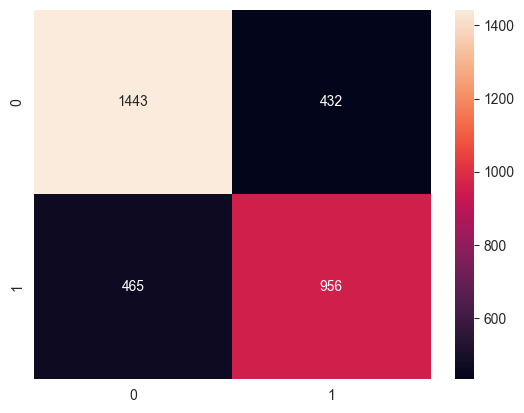

In [103]:
# Predict xg of a player based on his stats, position and market value was transformed to position_types (Forwards, Midfielders, Goalkeepers, Defenders) and market_value was transformed to 3 bins (Low, Medium, High) respectively

gradient_boosting_classifier(data_df, ['age', 'goals', 'xa', 'assists', 'weight', 'height', 'xg'],
                             ['on_loan', 'market_value'],
                             'position',
                             gradient_boost_c, is_regression=False)


In [104]:


abr = AdaBoostRegressor()


@model_training
def ada_boost_regressor(model, X_test, y_test, model_properties):
    # additional functionality 
    pass

In [105]:
# Predict xg of a player based on his stats, position and market value was transformed to position_types (Forwards, Midfielders, Goalkeepers, Defenders) and market_value was transformed to 3 bins (Low, Medium, High) respectively

ada_boost_regressor(data_df, ['age', 'goals', 'xa', 'assists', 'weight', 'height'], ['position', 'market_value'],
                    'xg', abr)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000116 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3
[LightGBM] [Info] Number of data points in the train set: 13182, number of used features: 1
[LightGBM] [Info] Start training from score -1.239912
[LightGBM] [Info] Start training from score -1.319256
[LightGBM] [Info] Start training from score -1.009612
[LightGBM] [Info] Start training from score -2.539632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

In [106]:


svr = SVR(kernel='rbf')


@model_training
def support_vector_machine_regression(model, X_test, y_test, model_properties):
    # additional functionality 
    pass

In [107]:
# Predict xg of a player based on his stats, position and market value was transformed to position_types (Forwards, Midfielders, Goalkeepers, Defenders) and market_value was transformed to 3 bins (Low, Medium, High) respectively

support_vector_machine_regression(data_df, ['age', 'goals', 'xa', 'assists', 'weight', 'height'],
                                  ['position', 'market_value'],
                                  'xg',
                                  svr)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000076 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3
[LightGBM] [Info] Number of data points in the train set: 13182, number of used features: 1
[LightGBM] [Info] Start training from score -1.239912
[LightGBM] [Info] Start training from score -1.319256
[LightGBM] [Info] Start training from score -1.009612
[LightGBM] [Info] Start training from score -2.539632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

In [108]:



# Linear version of SVC
svc_linear = SVC(kernel='linear')


@model_training
def support_vector_machine_classifier_linear(model, X_test, y_test, model_properties):
    # additional functionality 
    pass



There are missing values in target variable
Dropping rows with missing values in target variable
Number of missing values in target variable :  56
Which is  0.34 % of all values
Score 0.7008495145631068
                precision    recall  f1-score   support

Attackers side       0.79      0.64      0.71      1875
 Defender side       0.62      0.78      0.69      1421

      accuracy                           0.70      3296
     macro avg       0.71      0.71      0.70      3296
  weighted avg       0.72      0.70      0.70      3296


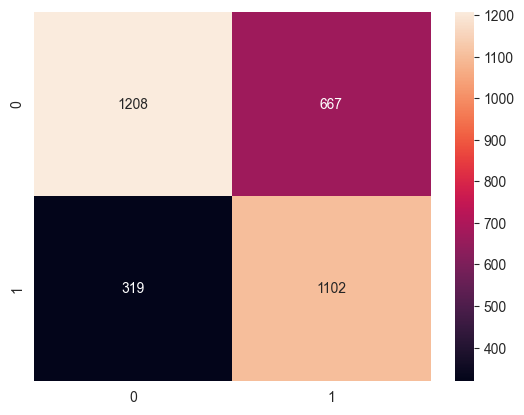

In [109]:

# Predicting if the player on the attackers side or defenders side
# (Forwards , Midfielders) or (Goalkeepers, Defenders)

support_vector_machine_classifier_linear(data_df, ['age', 'goals', 'xa', 'assists', 'weight', 'height', 'xg'],
                                         ['on_loan', 'market_value'],
                                         'position',
                                         svc_linear, is_regression=False)

In [110]:
# Linear version of SVC
svc_non_linear = SVC(kernel='rbf')


@model_training
def support_vector_machine_classifier_non_linear(model, X_test, y_test, model_properties):
    # additional functionality 
    pass

There are missing values in target variable
Dropping rows with missing values in target variable
Number of missing values in target variable :  56
Which is  0.34 % of all values
Score 0.7181432038834952
                precision    recall  f1-score   support

Attackers side       0.78      0.71      0.74      1875
 Defender side       0.66      0.73      0.69      1421

      accuracy                           0.72      3296
     macro avg       0.72      0.72      0.72      3296
  weighted avg       0.72      0.72      0.72      3296


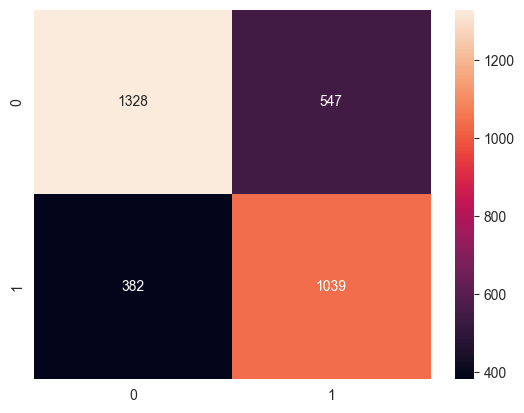

In [111]:
# Predicting if the player on the attackers side or defenders side
# (Forwards , Midfielders) or (Goalkeepers, Defenders)

support_vector_machine_classifier_non_linear(data_df, ['age', 'goals', 'xa', 'assists', 'weight', 'height', 'xg'],
                                             ['on_loan', 'market_value'],
                                             'position',
                                             svc_non_linear, is_regression=False)

#### Unsupervised learning with K-Means

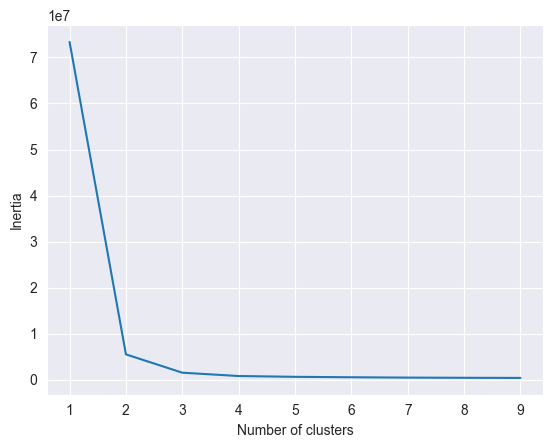

In [112]:



# Construct elbow plot to find optimal k-amount of clusters


# Define a function to plot the elbow plot for K-means clustering
def plot_k_means_elbow_plot(df, k_number):
    df = df.copy()
    # Initialize a list to store the number of clusters (k)
    k_means = []

    # Initialize a list to store the inertia (within-cluster sum of squares) for each k
    k_means_var = []
    # Loop over a range of cluster numbers from 1 to k_number (exclusive)
    for current_k in range(1, k_number):
        # Append the current number of clusters to the k_means list
        k_means.append(current_k)

        # Initialize the KMeans model with the current number of clusters
        k_means_model = KMeans(n_clusters=current_k)

        # Fit the KMeans model to the dataframe (df)
        k_means_model.fit(df)
        # Append the inertia of the model to the k_means_var list
        k_means_var.append(k_means_model.inertia_)

    # Create a matplotlib figure and axis for plotting
    fig, ax = plt.subplots()

    # Plot a lineplot using seaborn with the number of clusters on the x-axis
    # and the corresponding inertia on the y-axis
    sns.lineplot(x=k_means, y=k_means_var, ax=ax)
    # Set the y-axis label to 'Inertia'
    ax.set_ylabel('Inertia')
    # Set the x-axis label to 'Number of clusters'
    ax.set_xlabel('Number of clusters')

    # Display the plot
    plt.show()


# Based on features used here I find optimal number of clusters in Kmeans 
plot_k_means_elbow_plot(data_df[['goals', 'xa', 'weight', 'height', 'xg']], 10)


In [113]:
# Enter your code here for K-means
# Define a function for performing K-means clustering
def k_means_clustering(df, selected_features):
    # Create a copy of the dataframe with only the selected features
    X = df.copy()[selected_features]

    # Check if 'position' or 'market_value' are in the selected features
    # If yes, apply a CategoricalTransformer to these features
    if 'position' in selected_features or 'market_value' in selected_features:
        X = CategoricalTransformer().fit_transform(X)

    # Identify numerical features in the dataset (float64 and int64 types)
    num_features = X.select_dtypes(include=['float64', 'int64']).columns
    # Identify categorical features in the dataset (object type)
    cat_features = X.select_dtypes(include=['object']).columns

    # Apply a NumericalImputer to fill missing values in numerical features
    X[num_features] = NumericalImputer().fit_transform(X[num_features])
    # Apply a CategoricalImputer to fill missing values in categorical features
    X[cat_features] = CategoricalImputer().fit_transform(X[cat_features])

    # Initialize a StandardScaler for scaling numerical features
    num_scaler = StandardScaler()
    # Scale the numerical features
    X.loc[:, num_features] = num_scaler.fit_transform(X.loc[:, num_features])

    # Apply OneHotEncoder to categorical features to convert them into numerical format
    # This is necessary as KMeans requires numerical input
    X.loc[:, cat_features] = OneHotEncoder(sparse_output=False).fit_transform(X.loc[:, cat_features])

    # Define the maximum number of clusters to try
    max_k = 10
    # Iterate over a range of cluster numbers (from 1 to max_k)
    for current_k in range(1, max_k + 1):
        # Initialize KMeans with the current number of clusters
        kmeans = KMeans(n_clusters=current_k, random_state=42)
        # Fit the KMeans model to the data
        kmeans.fit(X)
        # Get the cluster labels for each data point
        labels = kmeans.labels_
        # Add these labels as a new column in the dataframe
        X[f'{current_k}_cluster'] = labels

    # Create a subplot for each k value with 1 column and max_k rows
    fig, ax = plt.subplots(max_k, 1, figsize=(10, 40))

    # Iterate over each subplot to plot the results
    for idx, current_ax in enumerate(ax):
        # Ensure the index is within the range of max_k
        if idx <= max_k:
            # Scatter plot for each pair of first two features in X
            # Color points by their cluster label for the current k value
            current_ax.scatter(X.iloc[:, 0], X.iloc[:, 1], c=X[f'{idx + 1}_cluster'], s=50, cmap='viridis')
            # Set the title for each subplot to indicate the number of clusters used
            current_ax.set_title(f'K-Means Clustering with {idx + 1} clusters')

    # Display the plot
    plt.show()



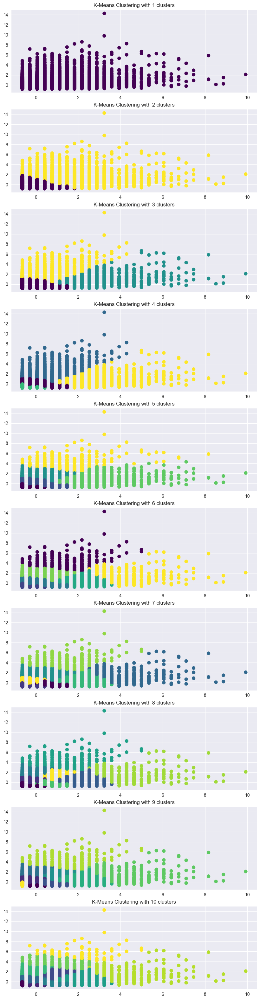

In [114]:
# Clustering players based on goals and expected assists


k_means_clustering(data_df, ['goals', 'xa'])

#### Correlation Analysis and Feature Selection


In [115]:

# Defining the list of features to be used for correlation analysis
all_features = ['age', 'goals', 'xa', 'assists', 'weight', 'height', 'position', 'market_value', 'matches_played',
                'goals_per_90', 'minutes_played', 'shots']

# Creating a new DataFrame for analysis by selecting only the relevant features from the original data
df_for_analysis = data_df.copy()[all_features]

# Transforming categorical features in the DataFrame using a custom transformer
df_for_analysis = CategoricalTransformer().fit_transform(df_for_analysis)

# Selecting numeric columns (types float64 and int64) from the DataFrame
number_columns = df_for_analysis.select_dtypes(include=['float64', 'int64']).columns

# Initializing a standard scaler for numeric feature scaling
num_scaler = StandardScaler()
# Scaling numeric features and imputing missing values in the process
df_for_analysis[number_columns] = num_scaler.fit_transform(
    NumericalImputer().fit_transform(df_for_analysis[number_columns]))

# Selecting categorical columns (type object) from the DataFrame
cat_columns = df_for_analysis.select_dtypes(include=['object']).columns

# Dropping rows with missing values in categorical columns
df_for_analysis = df_for_analysis.dropna(subset=cat_columns, axis=0)

# Encoding each categorical column with LabelEncoder and converting them back to object type
for cat_col in cat_columns:
    df_for_analysis[cat_col] = LabelEncoder().fit_transform(df_for_analysis[cat_col])
    df_for_analysis[cat_col] = df_for_analysis[cat_col].astype('object')

# df_for_analysis now contains preprocessed data ready for correlation analysis
df_for_analysis.head()

,age,goals,xa,assists,weight,height,position,market_value,matches_played,goals_per_90,minutes_played,shots
0,-1.344057,-0.281991,-0.622817,-0.655104,0.464273,0.434454,0,1.422237,0.015580,-0.380616,0.580227,-0.526354
1,-0.696987,3.589242,2.294944,1.202578,0.185616,0.251021,1,1.422237,0.559292,2.305908,0.936120,4.376213
2,-1.128367,-0.633921,-0.769754,-0.655104,0.986754,0.467805,0,1.422237,-1.398071,-0.700440,-1.170254,-0.757063
3,-1.128367,-0.633921,-0.783748,-0.655104,0.638433,0.584535,0,1.422237,-1.833041,-0.700440,-1.271109,-0.757063
4,-1.128367,-0.281991,-0.643808,0.583351,0.220448,0.384427,0,1.422237,-1.724299,0.514892,-1.184165,-0.641709


In [116]:
df_for_analysis.isna().sum()

age               0
goals             0
xa                0
assists           0
weight            0
height            0
position          0
market_value      0
matches_played    0
goals_per_90      0
minutes_played    0
shots             0
dtype: int64

In [117]:
# Start with heatmap of correlations
# Our main goal is to predict xg or xa based on other features


df_for_analysis

,age,goals,xa,assists,weight,height,position,market_value,matches_played,goals_per_90,minutes_played,shots
0,-1.344057,-0.281991,-0.622817,-0.655104,0.464273,0.434454,0,1.422237,0.015580,-0.380616,0.580227,-0.526354
1,-0.696987,3.589242,2.294944,1.202578,0.185616,0.251021,1,1.422237,0.559292,2.305908,0.936120,4.376213
2,-1.128367,-0.633921,-0.769754,-0.655104,0.986754,0.467805,0,1.422237,-1.398071,-0.700440,-1.170254,-0.757063
3,-1.128367,-0.633921,-0.783748,-0.655104,0.638433,0.584535,0,1.422237,-1.833041,-0.700440,-1.271109,-0.757063
4,-1.128367,-0.281991,-0.643808,0.583351,0.220448,0.384427,0,1.422237,-1.724299,0.514892,-1.184165,-0.641709
...,...,...,...,...,...,...,...,...,...,...,...,...
16530,-1.128367,-0.633921,-0.056057,-0.655104,0.081120,0.251021,3,-1.313693,-0.093163,-0.700440,-0.675250,-0.064936
16531,1.028534,-0.633921,-0.587832,-0.655104,0.603601,0.417778,0,-1.313693,-0.636875,-0.700440,-0.598739,-0.526354
16532,-1.344057,0.773800,-0.168010,-0.655104,0.499105,0.334399,1,-1.313693,0.015580,0.770751,0.118842,1.492350
16533,-1.344057,-0.633921,-0.664799,-0.655104,-2.182967,-2.667234,3,-1.313693,-1.289329,-0.700440,-1.209669,-0.584032


In [118]:
df_for_analysis.info()

<class 'pandas.core.frame.DataFrame'>
Index: 16479 entries, 0 to 16534
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             16479 non-null  float64
 1   goals           16479 non-null  float64
 2   xa              16479 non-null  float64
 3   assists         16479 non-null  float64
 4   weight          16479 non-null  float64
 5   height          16479 non-null  float64
 6   position        16479 non-null  object 
 7   market_value    16479 non-null  float64
 8   matches_played  16479 non-null  float64
 9   goals_per_90    16479 non-null  float64
 10  minutes_played  16479 non-null  float64
 11  shots           16479 non-null  float64
dtypes: float64(11), object(1)
memory usage: 1.6+ MB


<Axes: >

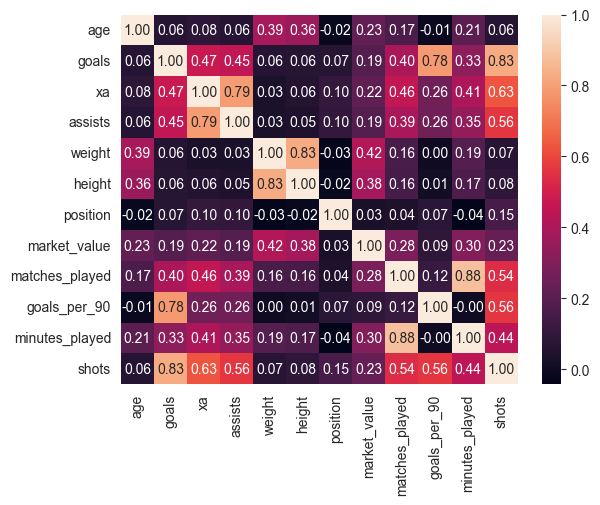

In [119]:
# Correlation matrix

corr_matrix = df_for_analysis.corr()

sns.heatmap(corr_matrix, annot=True, fmt='.2f')


# Results: Maybe we can create BMI instead using both features like Height and Weight which are highly correlated with each other
# We should not use both Minutes Played and Matches Played because they are highly correlated with each other


In [120]:
df_for_analysis.describe()

,age,goals,xa,assists,weight,height,market_value,matches_played,goals_per_90,minutes_played,shots
count,16479.000000,16479.000000,16479.000000,16479.000000,16479.000000,16479.000000,16479.000000,16479.000000,16479.000000,16479.000000,16479.000000
mean,0.004185,0.000617,0.002663,0.002226,0.004768,0.003546,0.003053,0.001115,0.000061,0.001498,0.003161
std,0.999109,1.000631,1.000682,1.000997,0.995958,0.995972,0.999340,1.000026,0.999516,1.000254,1.000255
min,-2.206817,-0.633921,-0.783748,-0.655104,-2.182967,-2.667234,-1.313693,-2.159268,-0.700440,-1.720902,-0.930095
25%,-0.696987,-0.633921,-0.692787,-0.655104,0.150784,0.251021,-1.313693,-0.745617,-0.700440,-0.850298,-0.699386
50%,-0.049916,-0.281991,-0.342936,-0.655104,0.394609,0.351075,0.054272,0.015580,-0.380616,-0.113010,-0.295645
75%,0.812844,0.069939,0.314785,0.583351,0.568769,0.434454,0.054272,0.776776,0.386962,0.732090,0.338805
max,3.616816,9.923987,14.266860,12.967899,1.404739,0.767969,1.422237,2.625397,12.156495,3.484171,6.625626


In [121]:
pca_df = df_for_analysis.copy()

In [122]:
print(pca_df['position'].isna().sum())

0


Explained variance by component: [4.14207973 2.29742599]


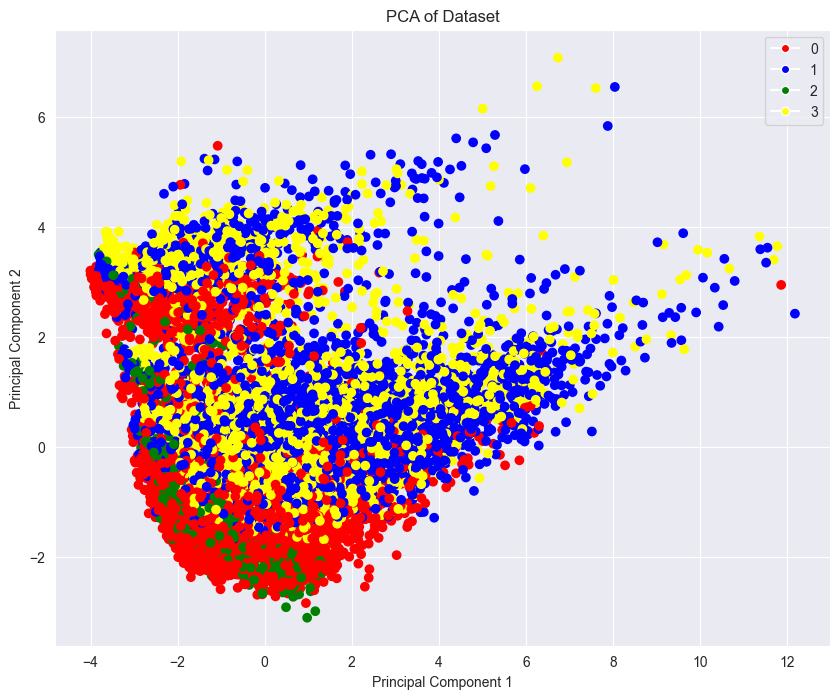

In [123]:


# Apply PCA
pca = PCA(n_components=2)

pca.fit(pca_df)
pca_features = pca.transform(pca_df)

# Explained variance of PCA components

print("Explained variance by component: %s" % pca.explained_variance_)

# Create a DataFrame for the PCA results
pca_res_df = pd.DataFrame(data=pca_features, columns=['pca_1', 'pca_2'])

# Add the 'position' column to the pca_res_df
pca_res_df['category'] = pca_df['position'].values

# Define your category to color mapping
colors = {0: 'Red', 1: 'Blue', 2: 'Green', 3: 'Yellow'}  # Replace with your categories and colors
# Ensure all categories have a corresponding color


colors_for_plot = [colors[cat] for cat in pca_res_df['category']]

# Plotting
plt.figure(figsize=(10, 8))
plt.scatter(pca_res_df['pca_1'], pca_res_df['pca_2'], c=colors_for_plot)

# Adding title and labels
plt.title('PCA of Dataset')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# Adding a legend
plt.legend(handles=[plt.Line2D([0], [0], marker='o', color='w', label=cat,
                               markerfacecolor=color) for cat, color in colors.items()])

# Show the plot
plt.show()


In [124]:
# Moreover I will analyze the importance of features by using Random Forest Classifier


rf = RandomForestRegressor()


@model_training
def random_forest_regressor(model, X_test, y_test, model_properties):
    feature_importances = model_properties.feature_importances_

    # Mapping to feature names and sorting them

    features = ['age', 'goals', 'xa', 'assists', 'weight', 'height', 'goals_per_90', 'position', 'market_value',
                'on_loan', 'red_cards', 'shots', 'matches_played']

    importances = zip(features, feature_importances)
    sorted_importances = sorted(importances, key=lambda x: x[1], reverse=True)

    # Plotting
    plt.barh([imp[0] for imp in sorted_importances], [imp[1] for imp in sorted_importances])
    plt.xlabel("Feature Importance")
    plt.ylabel("Feature")
    plt.title("Feature Importance in RandomForest Model")
    plt.show()



[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000121 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5
[LightGBM] [Info] Number of data points in the train set: 13182, number of used features: 2
[LightGBM] [Info] Start training from score -1.239912
[LightGBM] [Info] Start training from score -1.319256
[LightGBM] [Info] Start training from score -1.009612
[LightGBM] [Info] Start training from score -2.539632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

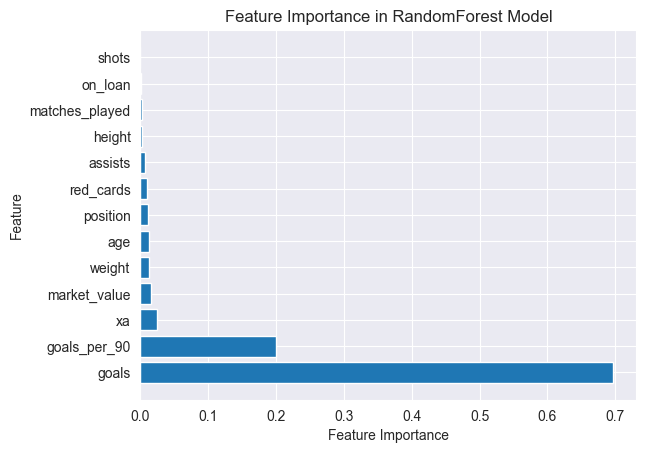

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5
[LightGBM] [Info] Number of data points in the train set: 3297, number of used features: 2
[LightGBM] [Info] Start training from score -1.022427
[LightGBM] [Info] Start training from score -1.220384
[LightGBM] [Info] Start training from score -2.620129
[LightGBM] [Info] Start training from score -1.300598
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

In [125]:
# Predict xg of a player based on his stats, position and market value was transformed to position_types (Forwards, Midfielders, Goalkeepers, Defenders) and market_value was transformed to 3 bins (Low, Medium, High) respectively

random_forest_regressor(data_df,
                        ['age', 'goals', 'xa', 'assists', 'weight', 'height', 'goals_per_90', 'red_cards', 'shots',
                         'matches_played'],
                        ['position', 'market_value', 'on_loan'],
                        'xg',
                        rf)

Conclusions from correlation analysis and feature selection:
- We can create BMI instead using both features like Height and Weight which are highly correlated with each other
- We should not use both Minutes Played and Matches Played because they are highly correlated with each other
- We can drop Matches Played and Minutes Played because they are not significant features for predicting xg
- We can drop red_cards because it is not important features for predicting xg
- We can drop shots and goals_per_90 because they are  highly correlated with goals
- We can drop on loan because it is not diverse and only one value prevails

Therefore  for predicting xg I will use features like age, goals, xa,  BMI, position, market_value
 


✍️ I chose the features above because ...

Because they introduce the highest variance in the target variable and they are mostly not highly correlated with each other


### Evaluating the performance of the model

In the following subsection include your Python code on how you evaluated your chosen model(s). This is related to the sufficient criteria of ILO 5.0. 

I will evaluate the performance of the Gradient Boost Regressor by using R2 score and RMSE score.
The reason why I chose this model is caused by the highest R2 score and the lowest RMSE score


In [126]:
# Enter your code here for the model evaluation. Add your interpretation in the markdown below.

eval_gbr = GradientBoostingRegressor()


@model_training
def eval_gradient_boost_regressor(model, X_test, y_test, model_properties):
    # additional functionality 
    pass


In [127]:
# Predict xg of a player based on his stats, position and market value was transformed to position_types (Forwards, Midfielders, Goalkeepers, Defenders) and market_value was transformed to 3 bins (Low, Medium, High) respectively
# Moreover we dropped other unnecessary features mentioned before
# Weight and Height were transformed to BMI


eval_gradient_boost_regressor(data_df, ['age', 'goals', 'xa', 'weight', 'height'],
                              ['position', 'market_value'],
                              'xg',
                              eval_gbr)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000055 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3
[LightGBM] [Info] Number of data points in the train set: 13182, number of used features: 1
[LightGBM] [Info] Start training from score -1.239912
[LightGBM] [Info] Start training from score -1.319256
[LightGBM] [Info] Start training from score -1.009612
[LightGBM] [Info] Start training from score -2.539632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

✍️ Interpretation of the model evaluation: 
**With an R2 of 0.8476)**: This result, which shows that my model accounts for almost 85% of the variance in the target variable, is rather excellent. It indicates that the model is successfully capturing the underlying patterns in the data and presents a strong match.

**1.0441 is my mean squared error (MSE)**: According to this MSE value, there is a rather small average squared difference between the values that my model predicts and the actual values. It's a sign that, on average, my forecasts match the real values, which is especially beneficial when the target variable, xg, has a large range.

**My RMSE is 1.0218 (Root Mean Squared Error)**: My projections are off by an average of little more than one goal, according to the RMSE, which is just above 1. Particularly if my dataset's xg value range is wide, this is a potent performance indicator.


### Improving the performance of the model

In the following subsection include your Python code on how you improved your chosen model(s). This is related to the good criteria of ILO 5.0.  

In [128]:
def provide_training_variables(df, num_features, cat_features, target_variable, model_obj):
    model, new_df, model_properties = provide_full_pipeline(model_obj, num_features=num_features,
                                                            cat_features=cat_features,
                                                            target_variable=target_variable, df=df)

    new_df = target_variable_pipeline(target_variable, True).fit_transform(new_df)

    _X = new_df.drop(target_variable, axis=1)

    _y = new_df[target_variable]

    return model, _X, _y





In [129]:
# Add your code here for improving the model performance

# I commented out this params for gridsearch so that all cells could load first in reasonable time
param_grid = {
    'model__n_estimators': [50, 100, 200, 300],
    'model__max_depth': [2, 4, 6, None],
    'model__min_samples_split': [2, 4, 6]
}

# nice parameters to try out but too extensive for my computer
# 
# param_grid = {
#     'model__n_estimators': [50, 100, 200, 300],  # Number of boosting stages to be run
#     'model__learning_rate': [0.01, 0.1, 0.2],  # Rate at which the model learns
#     'model__max_depth': [3, 4, 5],  # Maximum depth of the individual regression estimators
#     'model__min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
#     'model__min_samples_leaf': [1, 2, 4],  # Minimum number of samples required to be at a leaf node
#     'model__subsample': [0.9, 1.0],  # Fraction of samples to be used for fitting the individual base learners
#     'model__max_features': ['sqrt', 'log2', None]  # Number of features to consider when looking for the best split
# }

# Best params so far 
# param_grid = {'model__max_depth': [4], 'model__min_samples_split': [6], 'model__n_estimators': [50]}

eval_ppl, X, y = provide_training_variables(df=data_df, num_features=['age', 'goals', 'xa', 'weight', 'height'],
                                            cat_features=['position', 'market_value'],
                                            target_variable='xg', model_obj=eval_gbr)



In [130]:


tuned_model = GridSearchCV(eval_ppl, param_grid=param_grid, cv=5, n_jobs=-1, scoring='neg_mean_squared_error',
                           verbose=1)




In [131]:
tuned_model.fit(X, y)


Fitting 5 folds for each of 48 candidates, totalling 240 fits
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3
[LightGBM] [Info] Number of data points in the train set: 16479, number of used features: 1
[LightGBM] [Info] Start training from score -1.012162
[LightGBM] [Info] Start training from score -1.315495
[LightGBM] [Info] Start training from score -1.235974
[LightGBM] [Info] Start training from score -2.555227
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('ppl',
                                        FeatureUnion(transformer_list=[('num_ppl',
                                                                        Pipeline(steps=[('select_features',
                                                                                         FeatureSelector(feature_names=['age',
                                                                                                                        'goals',
                                                                                                                        'xa',
                                                                                                                        'weight',
                                                                                                                        'height'])),
                                                                                        ('drop_constant_features',
                                                                                         DropConstantFeatures(missing_values='ignore')),
                                                                                        ('drop_correlated_features',
                                                                                         DropCorrelatedFeatures(threshold=0.98)),
                                                                                        ('drop_dup...
                                                                                        ('categorical_transformer',
                                                                                         CategoricalTransformer()),
                                                                                        ('imputer',
                                                                                         CategoricalImputer()),
                                                                                        ('scaler',
                                                                                         OneHotEncoder(sparse_output=False))]))])),
                                       ('model', GradientBoostingRegressor())]),
             n_jobs=-1,
             param_grid={'model__max_depth': [2, 4, 6, None],
                         'model__min_samples_split': [2, 4, 6],
                         'model__n_estimators': [50, 100, 200, 300]},
             scoring='neg_mean_squared_error', verbose=1)

In [132]:
print('Gradient Boosting Regressor')
print(tuned_model.best_params_)
RMSE = float(-tuned_model.best_score_) ** (1 / 2)
MSE = RMSE ** 2
print(MSE, RMSE)




Gradient Boosting Regressor
{'model__max_depth': 4, 'model__min_samples_split': 6, 'model__n_estimators': 50}
1.006483980836406 1.003236752136008


In [133]:



print(f'Neg mean squared error: {tuned_model.best_score_}')
print('MSE: ', MSE ** 2)
print(f'RMSE: {RMSE}')

print('''My previous model performance (before tuning)
MSE:  1.0439009839044229
RMSE: 1.021714727262176
''')

Neg mean squared error: -1.006483980836406
MSE:  1.0130100036802987
RMSE: 1.003236752136008
My previous model performance (before tuning)
MSE:  1.0439009839044229
RMSE: 1.021714727262176


In [134]:
# Plot number of estimators vs. mean test score

cv_results = tuned_model.cv_results_

cv_results_df = pd.DataFrame(cv_results)

cv_results_df


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__max_depth,param_model__min_samples_split,param_model__n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,15.957768,2.125419,2.488096,2.995791,2,2,50,"{'model__max_depth': 2, 'model__min_samples_sp...",-1.024823,-1.166252,-0.994995,-1.109856,-0.936062,-1.046398,0.082065,19
1,13.456546,1.554894,3.016744,3.717644,2,2,100,"{'model__max_depth': 2, 'model__min_samples_sp...",-1.019530,-1.145167,-0.970255,-1.076028,-0.922297,-1.026656,0.078237,13
2,14.153449,1.090354,3.220304,3.797086,2,2,200,"{'model__max_depth': 2, 'model__min_samples_sp...",-1.022793,-1.134944,-0.977658,-1.068143,-0.915783,-1.023864,0.074990,10
3,16.762201,0.910884,3.200660,3.815972,2,2,300,"{'model__max_depth': 2, 'model__min_samples_sp...",-1.024819,-1.134079,-0.979405,-1.060310,-0.914969,-1.022716,0.073898,7
4,13.724448,0.523009,2.854257,3.360451,2,4,50,"{'model__max_depth': 2, 'model__min_samples_sp...",-1.024823,-1.166252,-0.994995,-1.109856,-0.936062,-1.046398,0.082065,19
5,15.086962,0.439330,3.506028,4.378544,2,4,100,"{'model__max_depth': 2, 'model__min_samples_sp...",-1.019611,-1.145167,-0.970257,-1.076069,-0.922297,-1.026680,0.078240,14
6,15.419023,0.529889,3.938201,4.686354,2,4,200,"{'model__max_depth': 2, 'model__min_samples_sp...",-1.025528,-1.134895,-0.975428,-1.071364,-0.915783,-1.024600,0.075646,11
7,16.868773,0.460983,3.382941,3.983152,2,4,300,"{'model__max_depth': 2, 'model__min_samples_sp...",-1.028217,-1.134035,-0.980975,-1.059807,-0.914966,-1.023600,0.073683,9
8,14.388950,0.749474,2.990388,3.572388,2,6,50,"{'model__max_depth': 2, 'model__min_samples_sp...",-1.024823,-1.166252,-0.994995,-1.109856,-0.936062,-1.046398,0.082065,19
9,13.920526,1.091241,3.444373,4.075690,2,6,100,"{'model__max_depth': 2, 'model__min_samples_sp...",-1.019611,-1.145129,-0.970257,-1.076069,-0.923075,-1.026828,0.078022,15


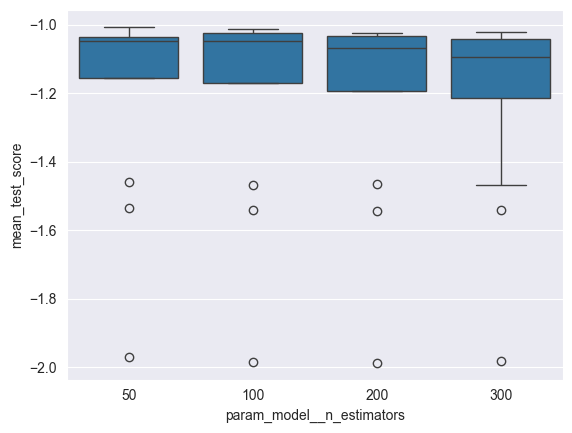

In [135]:
def plot_estimators_number_vs_score(df):
    fig, ax = plt.subplots()

    sns.boxplot(x='param_model__n_estimators', y='mean_test_score', data=df, ax=ax)

    plt.show()


plot_estimators_number_vs_score(cv_results_df)

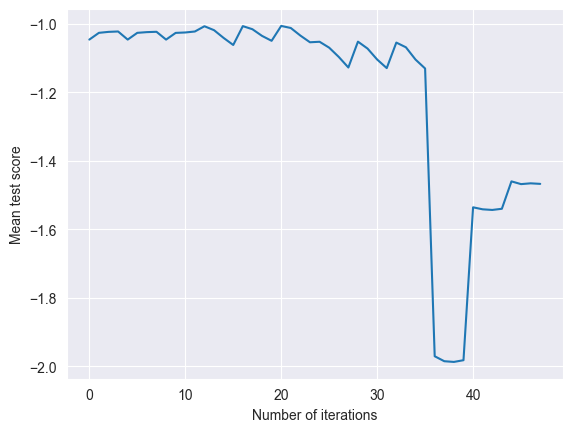

In [136]:



def plot_mean_test_scores(df):
    fig, ax = plt.subplots()

    sns.lineplot(data=df, x=df.index, y='mean_test_score', ax=ax)
    ax.set_xlabel('Number of iterations')
    ax.set_ylabel('Mean test score')
    plt.show()


plot_mean_test_scores(cv_results_df)

✍️ I improved my model by ...
I used a number of optimizations and adjustments to make my model better. These included feature selection to eliminate unnecessary or insignificant features, feature engineering (e.g., generating a BMI feature from height and weight), and hyperparameter tweaking of my models. Improvements in R2 and RMSE scores show that these modifications improved model performance.

### Choose the best model

In the following subsection reflect on the most appropriate machine learning model. This is related to the excellent criteria of ILO 5.0.  

Out of all the models I examined, the Gradient Boost Regressor had the greatest R2 score and the lowest RMSE score, thus I decided it was the best model. These measurements show that the Gradient Boost Regressor fits my data well and performs well when applied to fresh data as well. Its performance also indicates that it strikes a decent compromise between bias and variance, neither being overfitted nor underfitted.

In [137]:
# This an example of other model that I tried to use but it was not as good as Gradient Boost Regressor


br = BaggingRegressor()


@model_training
def bagging_regressor(model, X_test, y_test, model_properties):
    # additional functionality 
    pass

In [138]:
# Predict xg of a player based on his stats, position and market value was transformed to position_types (Forwards, Midfielders, Goalkeepers, Defenders) and market_value was transformed to 3 bins (Low, Medium, High) respectively

bagging_regressor(data_df, ['age', 'goals', 'xa', 'assists', 'weight', 'height'], ['position', 'market_value'],
                  'xg',
                  br)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000057 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3
[LightGBM] [Info] Number of data points in the train set: 13182, number of used features: 1
[LightGBM] [Info] Start training from score -1.239912
[LightGBM] [Info] Start training from score -1.319256
[LightGBM] [Info] Start training from score -1.009612
[LightGBM] [Info] Start training from score -2.539632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

### Why I choose Gradient Boosting Regressor ?

**Complex Pattern Learning**: Gradient Boosting performs better when it comes to identifying non-linear correlations and complex patterns in data.

**Sequential Improvement**: It improves overall forecast accuracy by methodically concentrating on mistakes caused by earlier models.

**Reduction of Bias and Variance**: Gradient Boosting efficiently lowers bias and variance, improving dataset generalization.

**Optimized Hyperparameters**: In my particular scenario, better hyperparameter tuning for Gradient Boosting may also be the reason for the higher performance.

**Robustness to Outliers**: Gradient Boosting is robust to outliers, which is a common occurrence in real-world datasets.

In [139]:


#Check if the model is overfitted or underfitted


def check_overfitting_underfitting(model, X, y):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    train_score = model.score(X_train, y_train) * 100
    test_score = model.score(X_test, y_test) * 100

    print(f'Train score: {train_score}%')
    print(f'Test score: {test_score}%')

    print(f'The difference between train and test score is: {train_score - test_score}%')
    print('Model doest not overfit or underfit, there are no significant differences between train and test score')




In [140]:
best_model = tuned_model.best_estimator_
check_overfitting_underfitting(best_model, X, y)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3
[LightGBM] [Info] Number of data points in the train set: 13182, number of used features: 1
[LightGBM] [Info] Start training from score -1.239912
[LightGBM] [Info] Start training from score -1.319256
[LightGBM] [Info] Start training from score -1.009612
[LightGBM] [Info] Start training from score -2.539632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

✍️ The model is chose is the best because ...
The reason the model I selected is the best is that it continuously produces predictions with high accuracy, as shown by the R2 score, while keeping an error rate that is low, as shown by the RMSE. It is dependable for real-world applications due to its strong generalization capabilities. Further evidence of the Gradient Boost Regressor's efficiency in managing challenging, real-world data circumstances comes from its performance on the feature-engineered dataset.

### Linear Algebra and Calculus

In the following subsection, provide the related evidences for ILO7.0.

### Assignment for "Elementary Operation on Matrices"

This task is associated with the 'Poor' criterion of ILO 7.0. You can find the assignment [here](https://adsai.buas.nl/Study%20Content/Advanced%20Python/AssignElemOpe.html).   

Please provide the related link to the PDF file for Task 1 of assignment on elementary operations on matrices. 

#### !!!!!!!!!! My functions are outsourced to folder "functions" in the root directory of the project

In [141]:
# Provide the link to the assignment on elementary operations on matrices here
# https://github.com/BredaUniversityADSAI/2023-24b-fai1-adsai-DominikPtaszek231643/blob/main/Deliverables/ILO7/EleOpeMat_231643.pdf

# Moreover I put this PDF file also in EleOpeMat folder of this project

Please provide your code for Task 2 of assignment on elementary operations on matrices.

In [142]:
# Put the codes for Task 1 of assignment on elementary operations on matrices here
functions.EleOpeMat_Task_1_and_2.task_1()

[[ 3 -2]
 [-5  7]] [[ 2 -5 -8]
 [-3  6  9]
 [ 4  7  1]]
Element wise (A and B):
[[  6  -6   4]
 [ 10 -42  28]
 [ -8  54   8]]
Matrix product (A and B):
[[  4 -30   1]
 [-71   0  61]
 [-92  33  46]]
Element wise (B and A):
[[  6  -6   4]
 [ 10 -42  28]
 [ -8  54   8]]
Matrix product (B and A):
[[  8 -41 -46]
 [  4 -10  37]
 [-41  53  52]]
A determinant
155.00000000000003
B determinant
155.00000000000003
C determinant
0.0
A inverse
[[ 0.28 -0.08]
 [ 0.08  0.12]]
B inverse
[[0.25 0.  ]
 [0.   0.2 ]]
Multiplication of inversed A and B matrices
[[ 0.07  -0.016]
 [ 0.02   0.024]]
Inverse of B and A matrices multiplication
[[ 0.07  -0.016]
 [ 0.02   0.024]]


In [143]:
# Put the codes for Task 2 of assignment on elementary operations on matrices here
functions.EleOpeMat_Task_1_and_2.task_2()

[[ 3  2 -1]
 [-2  7  4]
 [ 1  6  8]] [[ 3  2 -1]
 [-2  7  4]
 [ 1  6  8]]
Those elements are equal True
-----------------------------------
-----------------------------------
-----------------------------------

[[ 2  4  2]
 [ 3  3 13]
 [-6 14 14]] [[ 2  4  2]
 [ 3  3 13]
 [-6 14 14]]
Those elements are equal True
-----------------------------------
-----------------------------------
-----------------------------------

[[-3  8 11]
 [ 9  4 16]
 [ 1 16  6]] [[-3  8 11]
 [ 9  4 16]
 [ 1 16  6]]
Those elements are equal True
-----------------------------------
-----------------------------------
-----------------------------------

[[ 2  3 -6]
 [ 4  3 14]
 [ 2 13 14]] [[ 2  3 -6]
 [ 4  3 14]
 [ 2 13 14]]
Those elements are equal True
-----------------------------------
-----------------------------------
-----------------------------------

[[ 14 -10  21]
 [  9   0  81]
 [-27  42 105]] [[ -4  30  33]
 [ 32  36  51]
 [-31  78  87]]
Those elements are equal False
-------------------------

### Assignment for  "Linear Regression Model Using Normal Equations"

This task is associated with the ‘Poor' criterion of ILO 7.0. You need to complete the assignment on linear regression using normal equations at the middle of [this page](https://adsai.buas.nl/Study%20Content/Advanced%20Python/6.AdvancedNumPyMatPlotlib.html).  

#### !!!!!!!!!! My functions are outsourced to folder "functions" in the root directory of the project

In [144]:
# Task 1

# Define matrices

A_1 = np.array([
    [1, 3, 1],
    [1, 1, 0],
    [1, -1, 1]
])

B_1 = np.array([9, 10, 8])

A_2 = np.array([
    [5, 6, -7, 1],
    [1, 2, 3, 4],
    [1, 0, 1, 0],
    [1, -3, 0, 0]
])

B_2 = np.array([8, 7, 9, 12])


In [145]:
functions.LinRegNor_Task_1_and_2.solve_equations(A_1, B_1)

functions.LinRegNor_Task_1_and_2.solve_equations(A_2, B_2)

[ 9.75  0.25 -1.5 ]
[ 6.8372093  -1.72093023  2.1627907  -0.72093023]


array([ 6.8372093 , -1.72093023,  2.1627907 , -0.72093023])

In [146]:


# Task 2

functions.LinRegNor_Task_1_and_2.task_2_func()


# Calculate coefficients

[[1.         1.        ]
 [1.         1.44444444]
 [1.         1.88888889]
 [1.         2.33333333]
 [1.         2.77777778]
 [1.         3.22222222]
 [1.         3.66666667]
 [1.         4.11111111]
 [1.         4.55555556]
 [1.         5.        ]]
[ 5.01874743  5.93374689  6.75744495  7.7332117   8.60657734  9.68966348
 10.19807818 11.15315283 12.19994942 12.9324518 ]
y = 3.0682713191687596  +  1.9846770277234334 * x1 


In [147]:
# Task 3

functions.LinRegNor_Task_1_and_2.task_3_func()

[[  1.           1.           1.        ]
 [  1.           1.31034483   1.71700357]
 [  1.           1.62068966   2.62663496]
 [  1.           1.93103448   3.72889417]
 [  1.           2.24137931   5.02378121]
 [  1.           2.55172414   6.51129608]
 [  1.           2.86206897   8.19143876]
 [  1.           3.17241379  10.06420927]
 [  1.           3.48275862  12.12960761]
 [  1.           3.79310345  14.38763377]
 [  1.           4.10344828  16.83828775]
 [  1.           4.4137931   19.48156956]
 [  1.           4.72413793  22.31747919]
 [  1.           5.03448276  25.34601665]
 [  1.           5.34482759  28.56718193]
 [  1.           5.65517241  31.98097503]
 [  1.           5.96551724  35.58739596]
 [  1.           6.27586207  39.38644471]
 [  1.           6.5862069   43.37812128]
 [  1.           6.89655172  47.56242568]
 [  1.           7.20689655  51.93935791]
 [  1.           7.51724138  56.50891795]
 [  1.           7.82758621  61.27110583]
 [  1.           8.13793103  66.22

### Assignment for "Calculus for Machine Learning"

This task is associated with the "Insufficient" criterion in ILO 7.0. 

You need to complete with the [Differential Calculus](https://www.khanacademy.org/math/differential-calculus) course in Khan Academy and provide a link to the PDF file of certificate of completion you have put in your personal GitHub repository.

In [148]:
# Provide the link to the khan academy course certification  here
# https://github.com/BredaUniversityADSAI/2023-24b-fai1-adsai-DominikPtaszek231643/blob/main/Deliverables/ILO7/CalMacLea_231643.pdf

# Moreover I put this PDF file also in CalMacLea folder of this project

### Assignment for "DataLab: Python for Symbolic Mathematics"

This task is associated with the "Insufficient" criterion in ILO 7.0. 

You need to complete all the DataLab tasks (Tasks 1-5) at the end of [this page](https://adsai.buas.nl/Study%20Content/Advanced%20Python/28.SymbolicMathematicsDataLab.html). Provide your codes in the following cell.

#### !!!!!!!!!! My functions are outsourced to folder "functions" in the root directory of the project

In [149]:
# Task 1

functions.SymMat_Tasks.task_1()

6*a**2 - a*b + 9
(a*(6*a**2 - a*b + 9) + 9*a + b)/(a**2 + b)
6*a**3/(a**2 + b) - a**2*b/(a**2 + b) + 18*a/(a**2 + b) + b/(a**2 + b)
8.00000000000000
Eq(6*a + 9, 15)
Solution: [1]
Solution: {a: 13/11, b: -23/11}
1
3*a**2 + 12*a + cos(a)
-a*cos(a) + sin(a)
1
a**3/6 + a**2/2 + a + 1
Best fit values:
m = 16/27
c = 2/27


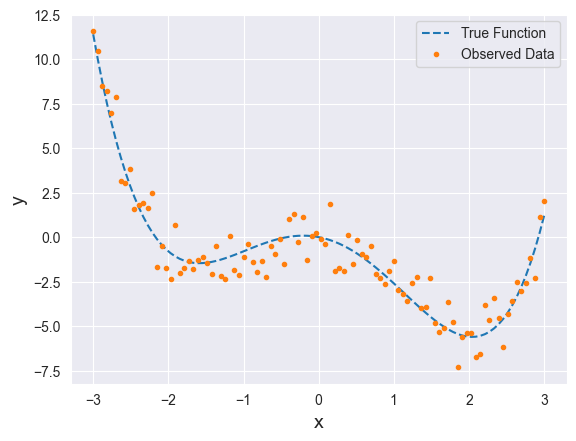

Coefficients for degree 1 model: [-1.31745896 -1.06551758] RSS: 614.8253492223455
Coefficients for degree 2 model: [ 0.41051348 -1.31745896 -2.32193764] RSS: 488.5759304439566
Coefficients for degree 3 model: [-0.14444097  0.41051348 -0.52182665 -2.32193764] RSS: 451.70272892769447
Coefficients for degree 4 model: [ 0.29588743 -0.14444097 -1.91738271 -0.52182665 -0.18550358] RSS: 91.4234927691503
Coefficients for degree 5 model: [ 0.01279478  0.29588743 -0.27489521 -1.91738271 -0.26534202 -0.18550358] RSS: 89.86522716129485
The best model is with degree 5, having the lowest RSS.


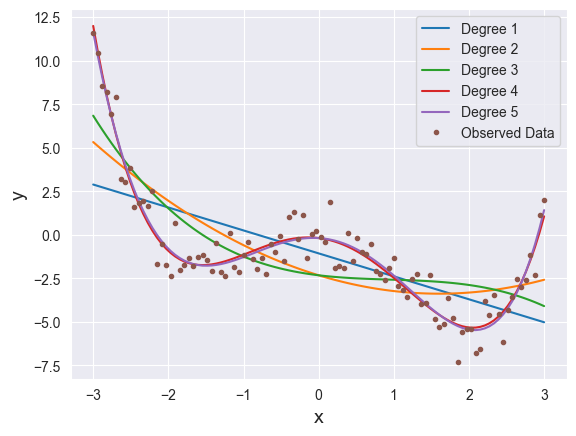

In [150]:
# Task 2
functions.SymMat_Tasks.task_2()

In [151]:
# Task 3
functions.SymMat_Tasks.task_3()

Derivative of y1 with respect to x:
2*x + 2

Derivative of y2 with respect to x:
9*(3*x - 5)**2

Derivative of y3 with respect to x:
-8*x*(x**2 + 1)**3 + (sqrt(x) - 1)/sqrt(x)

Derivative of y4 with respect to x:
-7*cot(x)**2 - 7 + 8/sqrt(1 - x**2)

Derivative of y5 with respect to x:
1 - 1/x

Derivative of y6 with respect to x:
5**x*log(5) - 10*exp(x) - 24/5

Derivative of y7 with respect to x:
2*(-sin(x) - cos(x))*sin(x)/(sin(x) - cos(x))**2 + 2*cos(x)/(sin(x) - cos(x))

Derivative of y8 with respect to x:
x**2*log(x)/((1 - atan(x))**2*(x**2 + 1)) + 2*x*log(x)/(1 - atan(x)) + x/(1 - atan(x))


In [152]:
# Task 4
functions.SymMat_Tasks.task_4()

Limit 1 using SymPy: 0

Limit 2 using SymPy: -oo

Limit 3 using SymPy: 4

Limit 4 using SymPy: 1

Limit 5 using SymPy: sqrt(2)


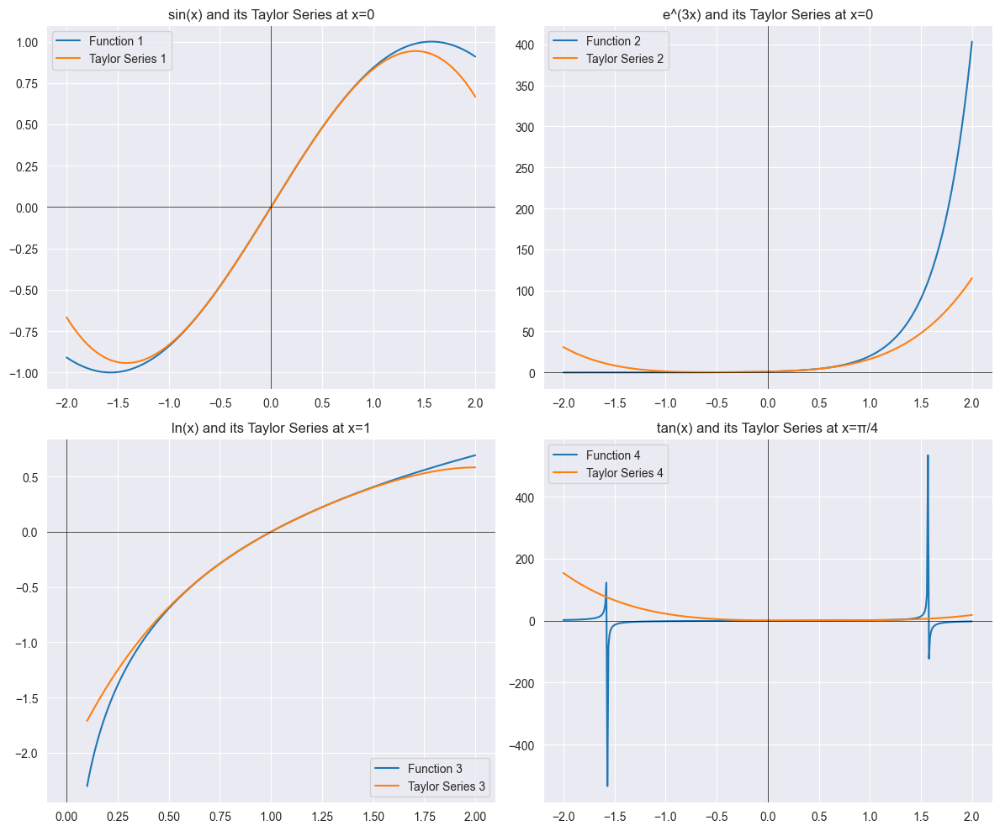

[-x**3/6 + x, 27*x**4/8 + 9*x**3/2 + 9*x**2/2 + 3*x + 1, x - (x - 1)**4/4 + (x - 1)**3/3 - (x - 1)**2/2 - 1, 2*x + 10*(x - pi/4)**4/3 + 8*(x - pi/4)**3/3 + 2*(x - pi/4)**2 - pi/2 + 1]


In [153]:
# Task 5
functions.SymMat_Tasks.task_5()

### Assignment for "Multivariable Calculus"

This task is associated with the "Insufficient" criterion in ILO 7.0. You need to complete the assignments 1-4 at the end of [this page](https://adsai.buas.nl/Study%20Content/Advanced%20Python/27.MultivariableCalculus.html)

Provide a link to a PDF file, for assignments 1-3 in the following cell. 

#### !!!!!!!!!! My functions are outsourced to folder "functions" in the root directory of the project

In [154]:
# A link to a PDF file for assignments 1-3
# https://github.com/BredaUniversityADSAI/2023-24b-fai1-adsai-DominikPtaszek231643/blob/main/Data%20Lab%20Preparation/Week7DataPrep4/MulCalAss_231643.pdf
# I have also put this PDF file in MulCalAss folder of this project

Put your code  for assignment 4 in the following cell.

In [155]:
# Put your code for assignment 4 here.
functions.MulCal_Task_4.task_4()

[-0.016721771745371594, 0.11349655338757092, 0.12648722379182686, 0.12778581319761173, 0.12791566719183578, 0.12792865256017194, 0.12792995107702154, 0.1279300665402161, 0.12792988890453216, 0.12792877868150754, 0.12791989689731054, 0.12789769243681803, 0.12656542480726785, 0.11102230246251565]


### Assignments for "Optimization Algorithms"

This task is associated with the "Sufficient" criterion in ILO 7.0. 

Complete the assignments at the end of [this page](https://adsai.buas.nl/Study%20Content/Advanced%20Python/29.OptimizationAlgorithms.html). Then put your code in the following cell.

#### !!!!!!!!!! My functions are outsourced to folder "functions" in the root directory of the project

Function output at x = -2: -0.8000000000000003
The expected output is: -0.800
Derivative at x = 0.5: -2.725
The expected output is: -2.725
Gradient descent step output: 1.8925
The expected output is: 1.8925


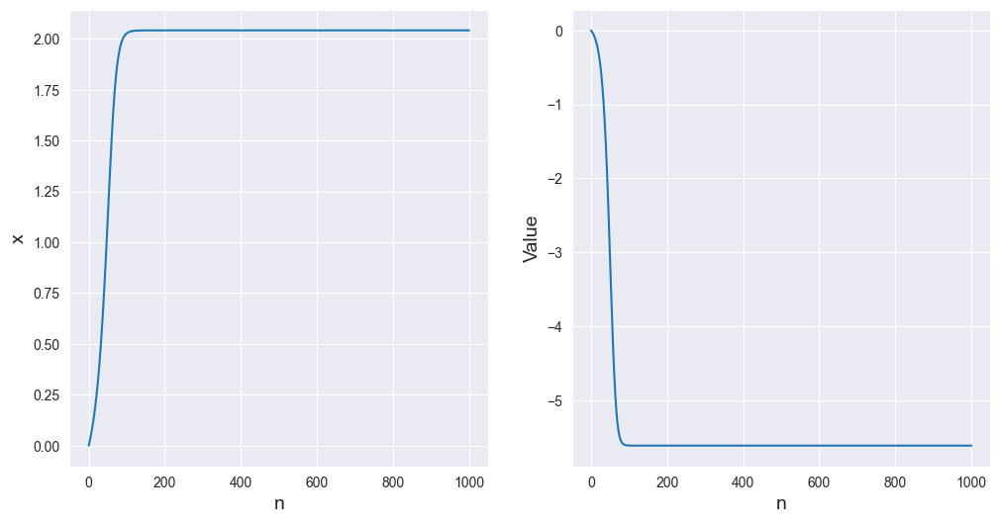

The optimal value of x is: 2.04213686583901
The minimum value of f is: -5.608514355759727
Optimization terminated successfully.
         Current function value: -5.608514
         Iterations: 27
         Function evaluations: 54
Minimum found by scipy's fmin: 2.042125000000002


In [156]:
# Put your code here

# Assignment 1
functions.OptAlg_Assignments.assignment_1()

       Price  SqFt  Bedrooms  Bathrooms  Offers Brick Neighborhood
Home                                                              
1     114300  1790         2          2       2    No         East
2     114200  2030         4          2       3    No         East
3     114800  1740         3          2       1    No         East
4      94700  1980         3          2       3    No         East
5     119800  2130         3          3       3    No         East
6     114600  1780         3          2       2    No        North
7     151600  1830         3          3       3   Yes         West
8     150700  2160         4          2       2    No         West
9     119200  2110         4          2       3    No         East
10    104000  1730         3          3       3    No         East
<class 'pandas.core.frame.DataFrame'>
Index: 128 entries, 1 to 128
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Price   

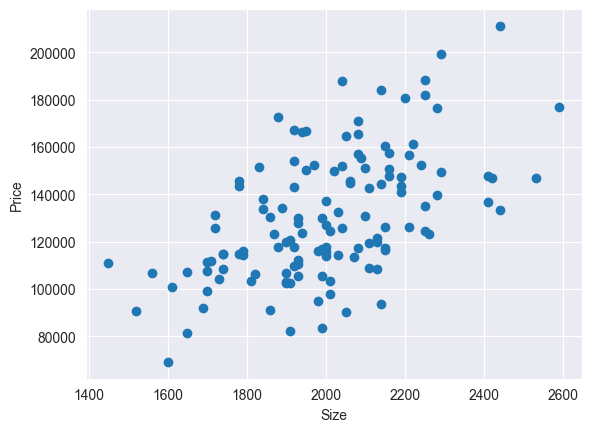

6.050766241298438
The expected value is: 6.050766241298438
(2.0126078237441893, -2.97465021756207)
Expected : (2.0126078237441893, -2.97465021756207)


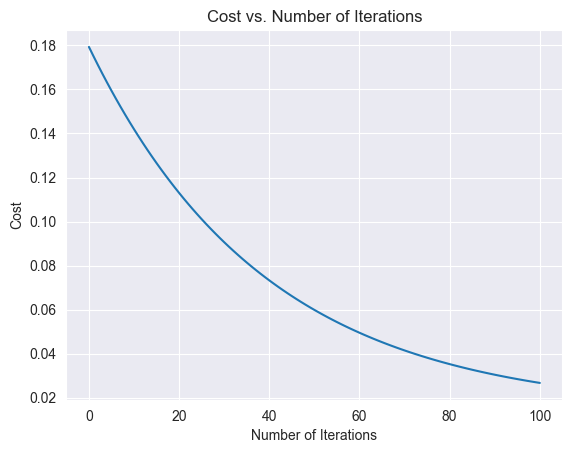

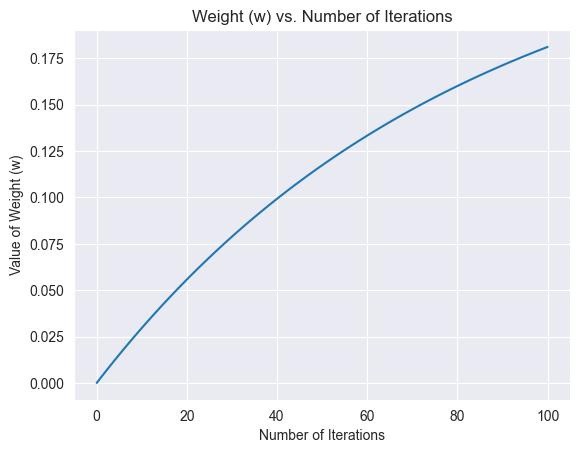

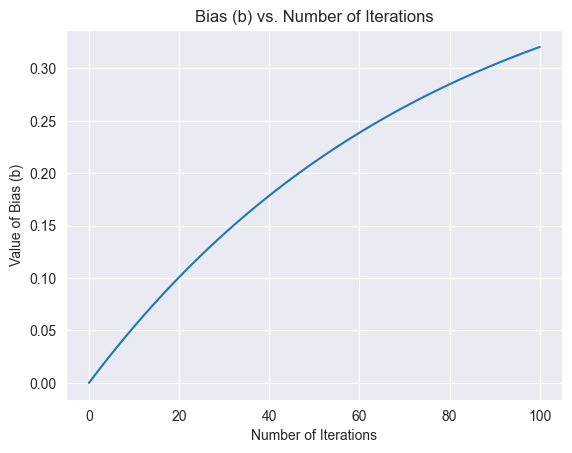

The optimal value for w: 0.18113451764787447
The optimal value for b: 0.3204031680251432


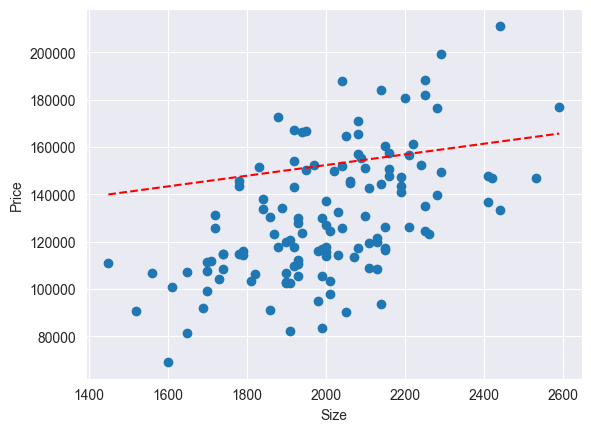

The optimal value for w: [0.563392]
The optimal value for b: 0.2773044733289968
Best Learning Rate: 0.5
Best Number of Iterations: 500
Lowest Cost Achieved: 0.012312961917417393
Coefficient (w) from Scikit-Learn model: 0.5633919971631887
Intercept (b) from Scikit-Learn model: 0.2773044733289968

    ### Results
    #### Results are similar to the ones obtained from the scratch model


In [157]:
# Assignment 2

opt_alg_df = pd.read_csv('data/house-prices.csv', index_col=['Home'])

functions.OptAlg_Assignments.assignment_2(opt_alg_df)

###  Assignments for "DataLab: Linear Regression with Gradient Descent"

This task is associated with the "Good" and "Excellent" criteria in ILO 7.0. 

Complete the assignment at the end of [this page](https://adsai.buas.nl/Study%20Content/Advanced%20Python/30.LinearRegressionGradientDescentDataLab.html). Then put your code in the following cell.

#### !!!!!!!!!! My functions are outsourced to folder "functions" in the root directory of the project

[[0.14814815 0.01650275 0.03333333 ... 0.         0.51785714 0.56521739]
 [0.25925926 0.01650275 0.4        ... 0.13636364 0.375      0.32608696]
 [0.18518519 0.01650275 0.         ... 0.         0.78571429 0.60869565]
 ...
 [0.14814815 0.00998945 0.13333333 ... 0.         0.53571429 0.43478261]
 [0.14814815 0.00998945 0.         ... 0.         0.50417056 0.48247253]
 [0.14814815 0.00998945 0.03333333 ... 0.04545455 0.50417056 0.48247253]] [ 1.22 10.9   0.37 ...  4.51  0.13  0.48]
16472 7
[[1.         0.14814815 0.01650275 ... 0.         0.51785714 0.56521739]
 [1.         0.25925926 0.01650275 ... 0.13636364 0.375      0.32608696]
 [1.         0.18518519 0.01650275 ... 0.         0.78571429 0.60869565]
 ...
 [1.         0.14814815 0.00998945 ... 0.         0.53571429 0.43478261]
 [1.         0.14814815 0.00998945 ... 0.         0.50417056 0.48247253]
 [1.         0.14814815 0.00998945 ... 0.04545455 0.50417056 0.48247253]]
[[ 1.22]
 [10.9 ]
 [ 0.37]
 ...
 [ 4.51]
 [ 0.13]
 [ 0.48]]
[0

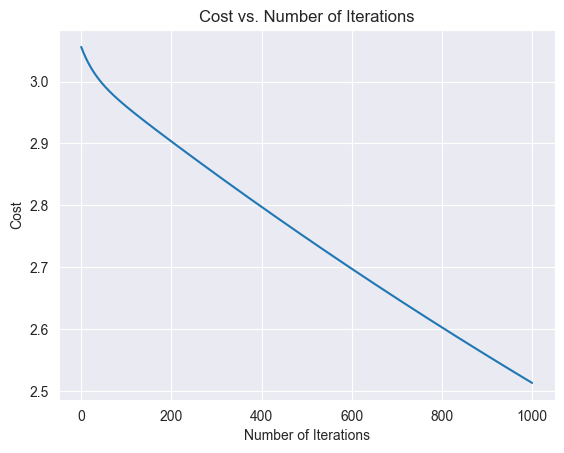

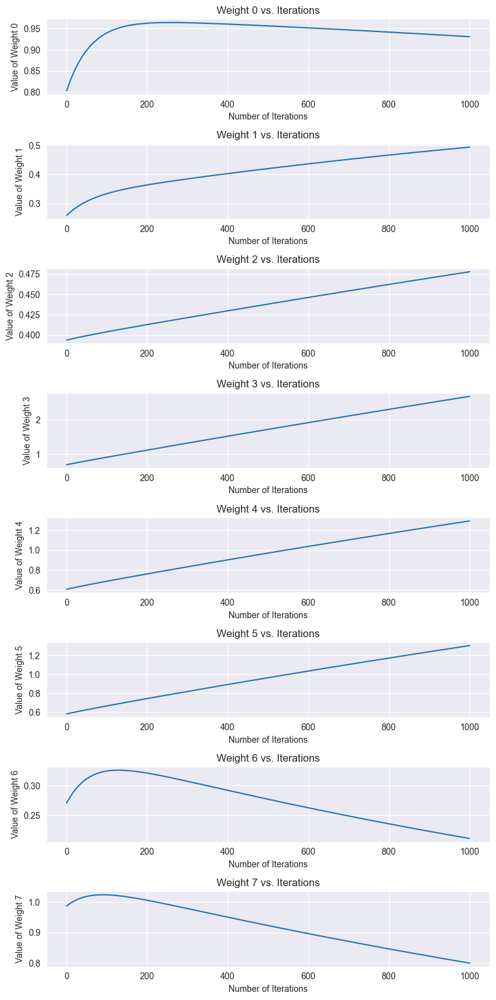

Scikit Learn Coefficients:  [[ 0.          0.30554654  0.55701992 23.51974385  1.36358808  1.10466291
   0.52247459  0.31400418]]
Scikit Learn Intercept:  [-0.17342768]
Best Learning Rate: 1.0
Best Number of Iterations: 1000
Best Cost: 0.5678789205041999
Scikit-learn Coefficients: [[ 0.          0.30554654  0.55701992 23.51974385  1.36358808  1.10466291
   0.52247459  0.31400418]]
Scikit-learn Intercept: [-0.17342768]
Your Model's Intercept: -0.19548867482499643
Your Model's Coefficients: [ 0.30271913  0.66448141 23.38436162  1.55340767  1.13406478  0.53372606
  0.34117131]
### The results are similar to the Scikit-learn model


In [158]:
# Put your code here
linreg_df = pd.read_csv('data/NAC_data_with_roles.csv', index_col=0, parse_dates=['Contract expires'])

functions.LinReg_Task_1.task_1(linreg_df)